<font color='lime'>***DATA PREPROCESSING FOR CLASSIFICATION*** for CSE445.6 GROUP 7










# preprocessing

**Information about the dataset**

>  This dataset combines the Annual Manufacturing Survey and the Technological Development and Innovation Survey. The columns represent a mix of economic, financial, and innovation-related variables. It has 125 features and we used them to classify rdstr which means R&D structure (organization of R&D activities)


---


>**What was the problem with this dataset and what we did?**

Firstly we removed columns with too much null values, then we filled the remaining columns that has few null values with mean value. Then we used label encoding to covert catagorical data into numerical data. After that we used IQR, Z-score and LOF method to find outliers and at the end we decided to remove outliers that were detected by LOF. Apart from that we used exploratory data analysis to find patterns and visualize the data. Then we used different machine learning models to find our desired result

---






















In [1]:
#importing all the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
# from skopt.searchcv import BayesSearchCV  # For Bayesian Optimization
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings("ignore")



In [2]:
# Google Sheets CSV export URL
sheet_id = "1dMzjYjsSstM5Uny4c2QNFrVucwmzHtg9"  # Extract from your Google Sheets link
sheet_name = "Sheet1"  # Change to the actual sheet name if needed
csv_url = f"https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}"
# Load data into a DataFrame
df = pd.read_csv(csv_url)


In [3]:
# Display first few rows
df.head(5)

,id,mat,dep,activfi,ene,invbr,pro,va,labor,sales,...,protf,protd,onlyprod,onlyproc,both1,none1,rdstr,inn,skill,lskill
0,141348,1179437.0,703922.0,2129049.0,523393.0,1268884.0,1624427.0,444990.0,100,8295581.0,...,0,1,0,0,0.0,1,NaN,0,2,0.693152
1,141348,1099479.0,231338.0,2239137.0,479172.0,110088.0,8259581.0,7160102.0,13,8259581.0,...,0,1,0,0,0.0,1,NaN,0,2,0.693152
2,141349,26049028.0,3215151.0,64502449.0,1375400.0,901898.0,42211502.0,16162474.0,212,44045647.0,...,0,1,1,1,1.0,0,Both,1,20,2.995733
3,141350,7648158.0,546259.0,1316816.0,12900.0,53469.0,9454825.0,1806667.0,29,9454825.0,...,0,1,0,0,0.0,1,NaN,0,3,1.098616
4,141350,5353710.0,195033.0,2128381.0,8772.0,811565.0,6618378.0,1264668.0,21,6618378.0,...,0,1,0,0,0.0,1,NaN,0,3,1.098616


In [4]:
#Displays summary of the whole dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68015 entries, 0 to 68014
Columns: 125 entries, id to lskill
dtypes: float64(83), int64(32), object(10)
memory usage: 64.9+ MB


In [5]:
df.columns #checks column names

Index(['id', 'mat', 'dep', 'activfi', 'ene', 'invbr', 'pro', 'va', 'labor',
       'sales',
       ...
       'protf', 'protd', 'onlyprod', 'onlyproc', 'both1', 'none1', 'rdstr',
       'inn', 'skill', 'lskill'],
      dtype='object', length=125)

In [6]:
df.shape #checks the total number of rows and columns

(68015, 125)

In [7]:
df.describe()

,id,mat,dep,activfi,ene,invbr,pro,va,labor,sales,...,rd_gasto,protf,protd,onlyprod,onlyproc,both1,none1,inn,skill,lskill
count,68015.000000,6.801500e+04,6.801500e+04,6.801500e+04,6.801500e+04,6.801500e+04,6.801500e+04,6.801500e+04,68015.000000,6.801500e+04,...,6.801500e+04,68015.000000,68015.000000,68015.000000,68015.000000,58120.000000,68015.000000,68015.000000,68015.000000,68015.000000
mean,552589.640888,1.898044e+07,1.097325e+06,1.973782e+07,2.011837e+06,1.763636e+06,3.002781e+07,1.104439e+07,90.412453,2.934131e+07,...,2.613404e+05,0.374491,0.220790,0.118430,0.175079,0.086614,0.780504,0.219496,3.529957,-6.450931
std,391039.063724,1.655028e+08,8.201411e+06,1.716169e+08,1.429147e+07,3.828499e+07,2.131983e+08,6.025969e+07,192.053946,2.075820e+08,...,2.897581e+06,0.547134,0.460442,0.323119,0.380037,0.281271,0.413908,0.413908,18.614422,6.264139
min,141348.000000,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,-2.280000e+08,9.900000e+02,0.000000e+00,1.000000,0.000000e+00,...,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-11.512930
25%,144991.000000,4.378460e+05,1.290500e+04,3.250490e+05,2.398700e+04,0.000000e+00,9.158840e+05,3.816960e+05,14.000000,9.111075e+05,...,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-11.512930
50%,427238.000000,1.280498e+06,5.983500e+04,1.098145e+06,8.325300e+04,1.748200e+04,2.610732e+06,1.159496e+06,31.000000,2.600000e+06,...,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-11.512930
75%,978212.000000,5.307961e+06,2.928670e+05,4.819894e+06,4.248860e+05,2.641790e+05,1.006929e+07,4.346354e+06,82.000000,1.000641e+07,...,0.000000e+00,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,2.000000,0.693152
max,987653.000000,9.630000e+09,4.280000e+08,1.170000e+10,4.700000e+08,5.050000e+09,1.220000e+10,3.830000e+09,4559.000000,1.210000e+10,...,1.830000e+08,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1449.000000,7.278629


In [8]:
duplicates = df[df.duplicated(keep='first')] #find the duplicate values
duplicates

,id,mat,dep,activfi,ene,invbr,pro,va,labor,sales,...,protf,protd,onlyprod,onlyproc,both1,none1,rdstr,inn,skill,lskill


In [9]:
df['rdstr'].value_counts() #shows the values

,count
rdstr,
Only process,6874
Both,5034
Only product,3021


In [10]:
#We tried to count the value for the dataset, we could not find 'none' as it was showing NaN in CSV format
df["rdstr"] = df["rdstr"].fillna("none") #As 'none' is a value in this classification problem, we did not make it into NaN
print(df["rdstr"].unique())# Now it will show 'none' as a value

['none' 'Both' 'Only process' 'Only product']


In [11]:
df['rdstr'].value_counts() #shows the values with 'none'

,count
rdstr,
none,53086
Only process,6874
Both,5034
Only product,3021


In [12]:
df.isnull().sum() # check for null values in the dataset

,0
id,0
mat,0
dep,0
activfi,0
ene,0
...,...
none1,0
rdstr,0
inn,0
skill,0


In [13]:
#We can only see the first few and last few rows as CSV but to preprocess properly, we have to make sure all the features are visible for preprocessing
pd.set_option("display.max_columns", None)  # Show all columns
print(df.head())  # Display the full dataset with all columns



       id         mat        dep     activfi        ene      invbr  \
0  141348   1179437.0   703922.0   2129049.0   523393.0  1268884.0   
1  141348   1099479.0   231338.0   2239137.0   479172.0   110088.0   
2  141349  26049028.0  3215151.0  64502449.0  1375400.0   901898.0   
3  141350   7648158.0   546259.0   1316816.0    12900.0    53469.0   
4  141350   5353710.0   195033.0   2128381.0     8772.0   811565.0   

          pro          va  labor       sales        imp  porcorext          w  \
0   1624427.0    444990.0    100   8295581.0        0.0        NaN  2258306.0   
1   8259581.0   7160102.0     13   8259581.0        0.0        NaN   475270.0   
2  42211502.0  16162474.0    212  44045647.0  3297764.0        NaN  8271887.0   
3   9454825.0   1806667.0     29   9454825.0        0.0        NaN  1125752.0   
4   6618378.0   1264668.0     21   6618378.0        0.0        NaN   930745.0   

            nom         exp     compras       tcpav      tgf      adv  \
0  2.258306e+08    

In [14]:
pd.set_option("display.max_rows", None)  # Show all rows
print(df.isnull().sum())


id                     0
mat                    0
dep                    0
activfi                0
ene                    0
invbr                  0
pro                    0
va                     0
labor                  0
sales                  0
imp                    0
porcorext          34887
w                      0
nom                    0
exp                    0
compras                0
tcpav                  0
tgf                    0
adv                    0
adv_pro                0
adv_admon              0
gdep                   0
gg                     0
dpto                   0
ciiu4                  0
year                   0
nfirms             58433
ciiu2                  0
defl                   0
pro_defl               0
va_defl                0
mat_defl               0
sales_defl             0
adv_defl               0
adv_pro_defl           0
adv_admon_defl         0
activfi_defl           0
imp_defl               0
exp_defl               0
invbr_defl             0


In [15]:
#These columns have been dropped as they have too much missing values
df = df.drop(columns=["porcorext"])
df = df.drop(columns=["nfirms"])
df = df.drop(columns=["ladv"])
df = df.drop(columns=["ladv_defl"])
df = df.drop(columns=["ladv_pro_defl"])
df = df.drop(columns=["ladv_admon_defl"])
df = df.drop(columns=["both1"])


In [16]:
pd.set_option("display.max_rows", None)
print(df.isnull().sum()) # we will check again to ensure if the columns with too much null values have been dropped properly

id                  0
mat                 0
dep                 0
activfi             0
ene                 0
invbr               0
pro                 0
va                  0
labor               0
sales               0
imp                 0
w                   0
nom                 0
exp                 0
compras             0
tcpav               0
tgf                 0
adv                 0
adv_pro             0
adv_admon           0
gdep                0
gg                  0
dpto                0
ciiu4               0
year                0
ciiu2               0
defl                0
pro_defl            0
va_defl             0
mat_defl            0
sales_defl          0
adv_defl            0
adv_pro_defl        0
adv_admon_defl      0
activfi_defl        0
imp_defl            0
exp_defl            0
invbr_defl          0
compras_defl        0
defl_fbk            0
k                   0
snom                0
slabor              0
ingsect             0
wsect               0
hg        

In [17]:
#We will fill the null values with the mean value for the following columns as they are small in number
df['lw']=df['lw'].fillna(df['lw'].mean())
df['lene']=df['lene'].fillna(df['lene'].mean())
df['ratktrab']=df['ratktrab'].fillna(df['ratktrab'].mean())
df['lsales_labor']=df['lsales_labor'].fillna(df['lsales_labor'].mean())

In [18]:
#We will check again to ensure all the null values are filled
pd.set_option("display.max_rows", None)
print(df.isnull().sum())

id                0
mat               0
dep               0
activfi           0
ene               0
invbr             0
pro               0
va                0
labor             0
sales             0
imp               0
w                 0
nom               0
exp               0
compras           0
tcpav             0
tgf               0
adv               0
adv_pro           0
adv_admon         0
gdep              0
gg                0
dpto              0
ciiu4             0
year              0
ciiu2             0
defl              0
pro_defl          0
va_defl           0
mat_defl          0
sales_defl        0
adv_defl          0
adv_pro_defl      0
adv_admon_defl    0
activfi_defl      0
imp_defl          0
exp_defl          0
invbr_defl        0
compras_defl      0
defl_fbk          0
k                 0
snom              0
slabor            0
ingsect           0
wsect             0
hg                0
hl                0
xp                0
im                0
lpro_defl         0


In [19]:
df = df.drop(columns=["i1r1c1n", "i1r2c1n", "i1r3c1n", "i1r1c1m", "i1r2c1m", "i1r3c1m", "i1r4c1", "i1r5c1", "i1r6c1"])

In [20]:
df.head()

,id,mat,dep,activfi,ene,invbr,pro,va,labor,sales,imp,w,nom,exp,compras,tcpav,tgf,adv,adv_pro,adv_admon,gdep,gg,dpto,ciiu4,year,ciiu2,defl,pro_defl,va_defl,mat_defl,sales_defl,adv_defl,adv_pro_defl,adv_admon_defl,activfi_defl,imp_defl,exp_defl,invbr_defl,compras_defl,defl_fbk,k,snom,slabor,ingsect,wsect,hg,hl,xp,im,lpro_defl,lmat_defl,lk,llabor,lhl,lw,lene,totalpro_sec,totalpro_emp,ms2,lms2,ms3,ihh,lms3,age,lage,allvars,mat_over_sales,va_nom,tfp_sample01,tfp_sample02,ratkout,ratktrab,tfp_sample1,tfp_sample2,tfp_sample,num_sample,mmlpro_defl,mmlmat_defl,mmlk,mmllabor,mmlhl,pmek,pmel,pmemat,kl,sales_labor,size,lpmek,lpmel,lkl,lpmemat,lsales_labor,lsize,employ,employ_rd,employ_doct,employ_mae,employ_esp,employ_prof,rd_gasto,protf,protd,onlyprod,onlyproc,none1,rdstr,inn,skill,lskill
0,141348,1179437.0,703922.0,2129049.0,523393.0,1268884.0,1624427.0,444990.0,100,8295581.0,0.0,2258306.0,2.258306e+08,0.0,783454.0,2868358.0,28222.0,40533.0,0.0,40533.0,703922.0,0,66,1081,2019,10,118.68,1368745.0,374949.4,993795.9,6989873.0,34153.180,0.0,34153.180,1793941.0,0.0,0.0,1069164.00,660139.9,100.96,1411576.0,2.610000e+11,29306,8915730.0,1846463.0,4.828546,482.85460,0,0,14.12941,13.80929,14.16022,4.605170,6.179716,14.63013,13.168090,8.520000e+10,24600000.0,0.028804,-3.547229,0.000830,3.154963e+02,-7.094458,2,0.693147,1,0.977344,0.320118,1,1,1.002181,3.074852,1,1,1,4,14.35704,13.68538,13.18354,3.348062,5.085099,0.969658,13687.45,9937.959,14115.76,69898.73,100,-0.030812,9.524235,9.555047,9.204117,11.15480,4.605170,100,0,0,0,2,5,0.0,0,1,0,0,1,none,0,2,0.693152
1,141348,1099479.0,231338.0,2239137.0,479172.0,110088.0,8259581.0,7160102.0,13,8259581.0,0.0,475270.0,6.178510e+06,0.0,759950.0,2.0,64.0,22811.0,0.0,22811.0,231338.0,0,66,1081,2020,10,109.89,7516227.0,6515700.0,1000527.0,7516227.0,20758.030,0.0,20758.030,2037617.0,0.0,0.0,100180.20,691555.2,79.69,2383906.0,2.430000e+11,26558,9145062.0,1765530.0,5.179782,67.33717,0,0,15.83257,13.81604,14.68425,2.564949,4.209713,13.07164,13.079810,1.340000e+11,7516227.0,0.005628,-5.180072,0.000032,1.184225e+06,-10.360150,4,1.386294,1,0.872634,2.016538,1,1,0.927471,5.724967,1,1,1,4,14.35704,13.68538,13.18354,3.348062,5.085099,3.152904,578171.30,76963.610,183377.40,578171.30,13,1.148324,13.267630,12.119300,11.251090,13.26763,2.564949,112,0,0,0,2,5,0.0,0,1,0,0,1,none,0,2,0.693152
2,141349,26049028.0,3215151.0,64502449.0,1375400.0,901898.0,42211502.0,16162474.0,212,44045647.0,3297764.0,8271887.0,1.753640e+09,23623266.0,19514563.0,16412824.0,36270.0,12643.0,0.0,12643.0,3215151.0,0,13,2221,2020,22,109.89,38400000.0,14700000.0,23700000.0,40100000.0,11505.140,0.0,11505.140,58700000.0,3000968.0,21500000.0,820728.00,17800000.0,79.69,76900000.0,2.420000e+11,17457,13900000.0,4381852.0,3.165694,671.12710,1,1,17.46389,16.98118,18.15811,5.356586,6.508958,15.92837,14.134260,6.230000e+10,87300000.0,0.140009,-1.966047,0.019603,9.762359e+04,-3.932094,2,0.693147,1,0.972359,0.482712,1,1,1.039752,3.389866,1,1,1,3,15.71765,15.23649,14.96569,3.917237,5.133423,0.499466,181191.10,111814.300,362769.50,189064.10,212,-0.694216,12.107310,12.801520,11.624590,12.14984,5.356586,212,3,0,6,14,32,21000.0,0,1,1,1,0,Both,1,20,2.995733
3,141350,7648158.0,546259.0,1316816.0,12900.0,53469.0,9454825.0,1806667.0,29,9454825.0,0.0,1125752.0,3.264681e+07,0.0,1100692.0,6839920.0,72824.0,0.0,0.0,0.0,546259.0,0,5,3290,2019,32,118.68,7966654.0,1522301.0,6444353.0,7966654.0,0.000,0.0,0.000,1109552.0,0.0,0.0,45053.08,927445.3,100.96,763230.0,3.730000e+11,35332,10600000.0,2665061.0,3.961486,114.88310,0,0,15.89077,15.67871,13.54531,3.367296,4.743915,13.93396,9.464983,2.510000e+11,7966654.0,0.003179,-5.751192,0.000010,9.132870e+05,-11.502380,1,0.000010,1,0.986655,0.212060,1,1,0.852401,4.022609,1,1,1,4,14.84482,14.03219,14.17453,3.433146,4.850585,10.438080,274712.20,222219.100,26318.28,274712.20,29,2.345460,12.523480,10.178020,12.311420,12.52348,3.367296,131,19,0,0,3,15,3197312.0,0,1,0,0,1,none,0,3,1.098616
4,141350,5353710.0,195033.0,2128381.0,8772.0,811565.0,66183

In [21]:
#As machine learning only allows numbers, we will use lable encoder to turn words into numbers
from sklearn.preprocessing import LabelEncoder
#label encoding
le = LabelEncoder()
df["rdstr"] = le.fit_transform(df["rdstr"])


In [22]:
df.head(47)

,id,mat,dep,activfi,ene,invbr,pro,va,labor,sales,imp,w,nom,exp,compras,tcpav,tgf,adv,adv_pro,adv_admon,gdep,gg,dpto,ciiu4,year,ciiu2,defl,pro_defl,va_defl,mat_defl,sales_defl,adv_defl,adv_pro_defl,adv_admon_defl,activfi_defl,imp_defl,exp_defl,invbr_defl,compras_defl,defl_fbk,k,snom,slabor,ingsect,wsect,hg,hl,xp,im,lpro_defl,lmat_defl,lk,llabor,lhl,lw,lene,totalpro_sec,totalpro_emp,ms2,lms2,ms3,ihh,lms3,age,lage,allvars,mat_over_sales,va_nom,tfp_sample01,tfp_sample02,ratkout,ratktrab,tfp_sample1,tfp_sample2,tfp_sample,num_sample,mmlpro_defl,mmlmat_defl,mmlk,mmllabor,mmlhl,pmek,pmel,pmemat,kl,sales_labor,size,lpmek,lpmel,lkl,lpmemat,lsales_labor,lsize,employ,employ_rd,employ_doct,employ_mae,employ_esp,employ_prof,rd_gasto,protf,protd,onlyprod,onlyproc,none1,rdstr,inn,skill,lskill
0,141348,1179437.0,703922.0,2.129049e+06,523393.0,1268884.0,1624427.0,444990.0,100,8.295581e+06,0.0,2258306.0,2.258306e+08,0.0,783454.0,2868358.0,28222.0,40533.0,0.0,40533.0,703922.0,0,66,1081,2019,10,118.68,1368745.0,3.749494e+05,9.937959e+05,6989873.0,3.415318e+04,0.0000,3.415318e+04,1.793941e+06,0.0,0.00,1.069164e+06,6.601399e+05,100.96,1.411576e+06,2.610000e+11,29306,8915730.0,1846463.0,4.828546,482.85460,0,0,14.12941,13.809290,14.160220,4.605170,6.179716,14.63013,13.168090,8.520000e+10,2.460000e+07,0.028804,-3.547229,8.297000e-04,3.154963e+02,-7.094458,2,0.693147,1,0.977344,0.320118,1,1,1.002181,3.074852,1,1,1,4,14.35704,13.68538,13.18354,3.348062,5.085099,0.969658,13687.45,9.937959e+03,1.411576e+04,69898.73,100,-0.030812,9.524235,9.555047,9.204117,11.154800,4.605170,100,0,0,0,2,5,0.0,0,1,0,0,1,3,0,2,0.693152
1,141348,1099479.0,231338.0,2.239137e+06,479172.0,110088.0,8259581.0,7160102.0,13,8.259581e+06,0.0,475270.0,6.178510e+06,0.0,759950.0,2.0,64.0,22811.0,0.0,22811.0,231338.0,0,66,1081,2020,10,109.89,7516227.0,6.515700e+06,1.000527e+06,7516227.0,2.075803e+04,0.0000,2.075803e+04,2.037617e+06,0.0,0.00,1.001802e+05,6.915552e+05,79.69,2.383906e+06,2.430000e+11,26558,9145062.0,1765530.0,5.179782,67.33717,0,0,15.83257,13.816040,14.684250,2.564949,4.209713,13.07164,13.079810,1.340000e+11,7.516227e+06,0.005628,-5.180072,3.170000e-05,1.184225e+06,-10.360150,4,1.386294,1,0.872634,2.016538,1,1,0.927471,5.724967,1,1,1,4,14.35704,13.68538,13.18354,3.348062,5.085099,3.152904,578171.30,7.696361e+04,1.833774e+05,578171.30,13,1.148324,13.267630,12.119300,11.251090,13.267630,2.564949,112,0,0,0,2,5,0.0,0,1,0,0,1,3,0,2,0.693152
2,141349,26049028.0,3215151.0,6.450245e+07,1375400.0,901898.0,42211502.0,16162474.0,212,4.404565e+07,3297764.0,8271887.0,1.753640e+09,23623266.0,19514563.0,16412824.0,36270.0,12643.0,0.0,12643.0,3215151.0,0,13,2221,2020,22,109.89,38400000.0,1.470000e+07,2.370000e+07,40100000.0,1.150514e+04,0.0000,1.150514e+04,5.870000e+07,3000968.0,21500000.00,8.207280e+05,1.780000e+07,79.69,7.690000e+07,2.420000e+11,17457,13900000.0,4381852.0,3.165694,671.12710,1,1,17.46389,16.981180,18.158110,5.356586,6.508958,15.92837,14.134260,6.230000e+10,8.730000e+07,0.140009,-1.966047,1.960260e-02,9.762359e+04,-3.932094,2,0.693147,1,0.972359,0.482712,1,1,1.039752,3.389866,1,1,1,3,15.71765,15.23649,14.96569,3.917237,5.133423,0.499466,181191.10,1.118143e+05,3.627695e+05,189064.10,212,-0.694216,12.107310,12.801520,11.624590,12.149840,5.356586,212,3,0,6,14,32,21000.0,0,1,1,1,0,0,1,20,2.995733
3,141350,7648158.0,546259.0,1.316816e+06,12900.0,53469.0,9454825.0,1806667.0,29,9.454825e+06,0.0,1125752.0,3.264681e+07,0.0,1100692.0,6839920.0,72824.0,0.0,0.0,0.0,546259.0,0,5,3290,2019,32,118.68,7966654.0,1.522301e+06,6.444353e+06,7966654.0,0.000000e+00,0.0000,0.000000e+00,1.109552e+06,0.0,0.00,4.505308e+04,9.274453e+05,100.96,7.632300e+05,3.730000e+11,35332,10600000.0,2665061.0,3.961486,114.88310,0,0,15.89077,15.678710,13.545310,3.367296,4.743915,13.93396,9.464983,2.510000e+11,7.966654e+06,0.003179,-5.751192,1.010000e-05,9.132870e+05,-11.502380,1,0.000010,1,0.986655,0.212060,1,1,0.852401,4.022609,1,1,1,4,14.84482,14.03219,14.17453,3.433146,4.850585,10.438080,274712.20,2.222191e+05,

In [23]:
#Explatory data analysiss
#descriptive analysis
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,68015.0,5.525896e+05,3.910391e+05,1.413480e+05,1.449910e+05,4.272380e+05,9.782120e+05,9.876530e+05
mat,68015.0,1.898044e+07,1.655028e+08,1.000000e+00,4.378460e+05,1.280498e+06,5.307961e+06,9.630000e+09
dep,68015.0,1.097325e+06,8.201411e+06,0.000000e+00,1.290500e+04,5.983500e+04,2.928670e+05,4.280000e+08
activfi,68015.0,1.973782e+07,1.716169e+08,1.000000e+00,3.250490e+05,1.098145e+06,4.819894e+06,1.170000e+10
ene,68015.0,2.011837e+06,1.429147e+07,0.000000e+00,2.398700e+04,8.325300e+04,4.248860e+05,4.700000e+08
invbr,68015.0,1.763636e+06,3.828499e+07,-2.280000e+08,0.000000e+00,1.748200e+04,2.641790e+05,5.050000e+09
pro,68015.0,3.002781e+07,2.131983e+08,9.900000e+02,9.158840e+05,2.610732e+06,1.006929e+07,1.220000e+10
va,68015.0,1.104439e+07,6.025969e+07,0.000000e+00,3.816960e+05,1.159496e+06,4.346354e+06,3.830000e+09
labor,68015.0,9.041245e+01,1.920539e+02,1.000000e+00,1.400000e+01,3.100000e+01,8.200000e+01,4.559000e+03
sales,68015.0,2.934131e+07,2.075820e+08,0.000000e+00,9.111075e+05,2.600000e+06,1.000641e+07,1.210000e+10


In [24]:
import numpy as np
import pandas as pd

def find_outliers_iqr(df):
    outlier_dict = {}  # Dictionary to store outlier counts per column

    for column in df.select_dtypes(include=np.number).columns:  # Select only numeric columns
        Q1 = df[column].quantile(0.25)  # 25th percentile
        Q3 = df[column].quantile(0.75)  # 75th percentile
        IQR = Q3 - Q1  # Interquartile Range

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Find outliers in the original dataset (including 0,1,2,3)
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        outlier_count = outliers.shape[0]

        # Store in dictionary
        outlier_dict[column] = outlier_count

    return outlier_dict

# Detect outliers in all numeric columns (including 0,1,2,3)
outliers = find_outliers_iqr(df)

# Print outlier count per column
print("Outlier Counts per Column:")
for col, count in outliers.items():
    print(f"{col}: {count} outliers")


Outlier Counts per Column:
id: 0 outliers
mat: 10574 outliers
dep: 10516 outliers
activfi: 10589 outliers
ene: 10745 outliers
invbr: 12211 outliers
pro: 10372 outliers
va: 10198 outliers
labor: 7899 outliers
sales: 10324 outliers
imp: 14687 outliers
w: 8847 outliers
nom: 11544 outliers
exp: 15110 outliers
compras: 10754 outliers
tcpav: 10326 outliers
tgf: 9956 outliers
adv: 11841 outliers
adv_pro: 6339 outliers
adv_admon: 11862 outliers
gdep: 10516 outliers
gg: 1797 outliers
dpto: 142 outliers
ciiu4: 167 outliers
year: 0 outliers
ciiu2: 167 outliers
defl: 0 outliers
pro_defl: 10398 outliers
va_defl: 10151 outliers
mat_defl: 10506 outliers
sales_defl: 10341 outliers
adv_defl: 11778 outliers
adv_pro_defl: 6339 outliers
adv_admon_defl: 11819 outliers
activfi_defl: 10573 outliers
imp_defl: 14687 outliers
exp_defl: 15120 outliers
invbr_defl: 12129 outliers
compras_defl: 10727 outliers
defl_fbk: 0 outliers
k: 10588 outliers
snom: 1885 outliers
slabor: 6391 outliers
ingsect: 3498 outliers
wse

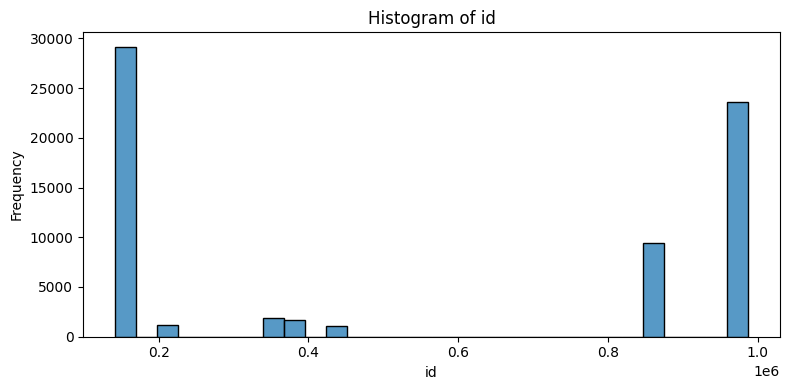

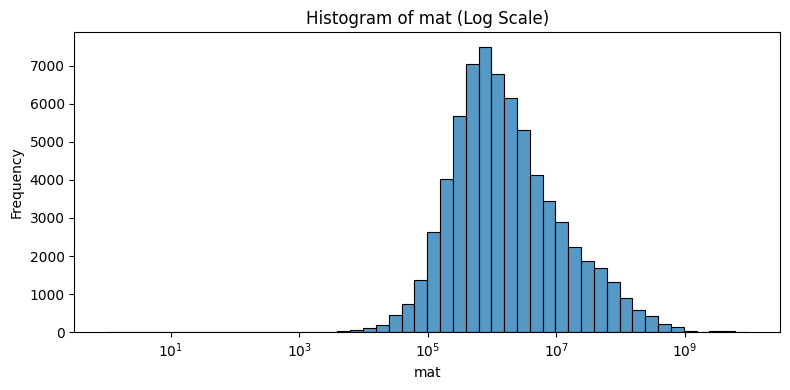

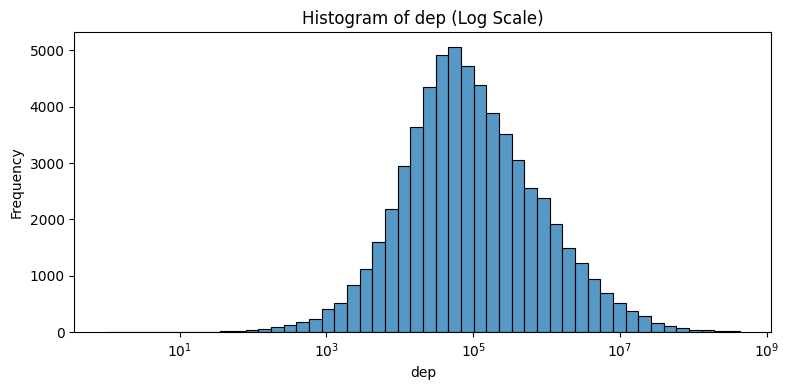

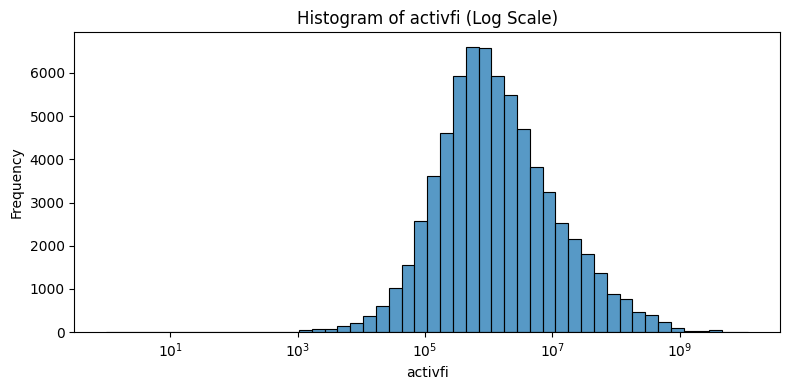

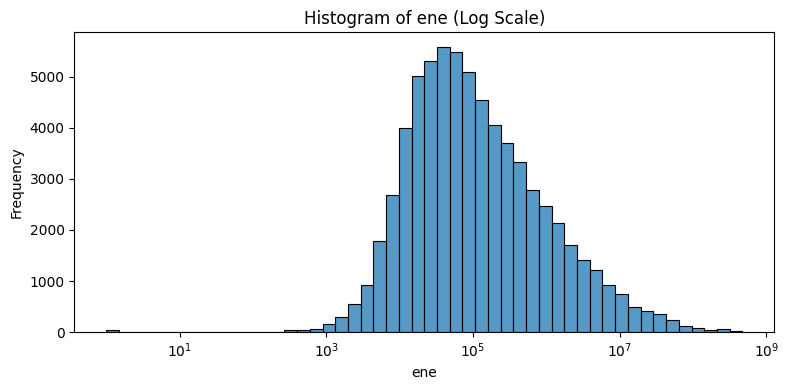

...

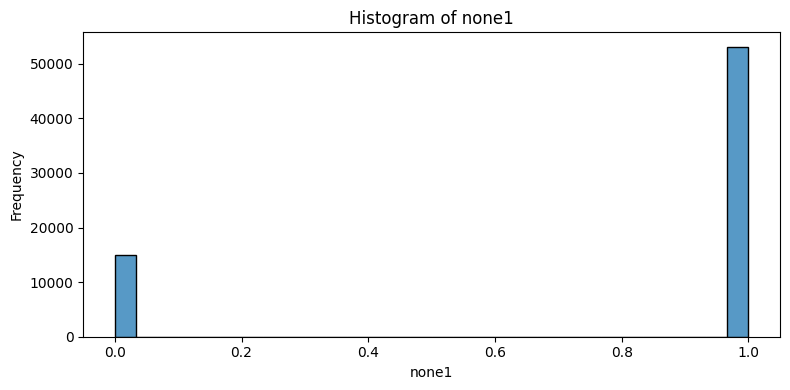

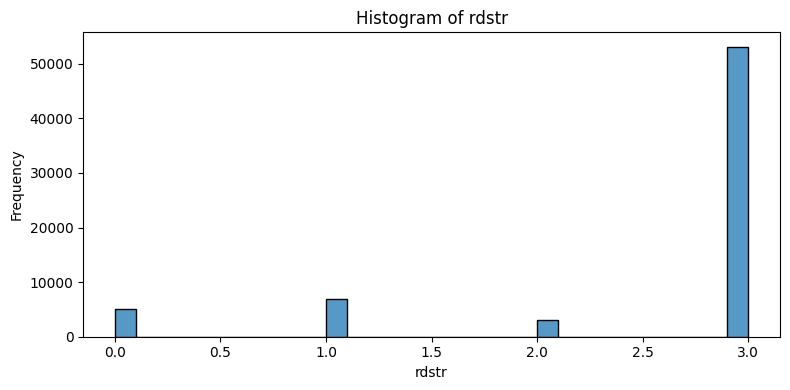

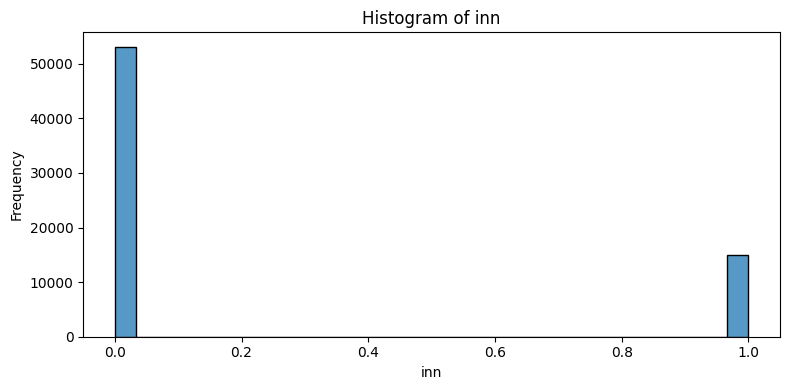

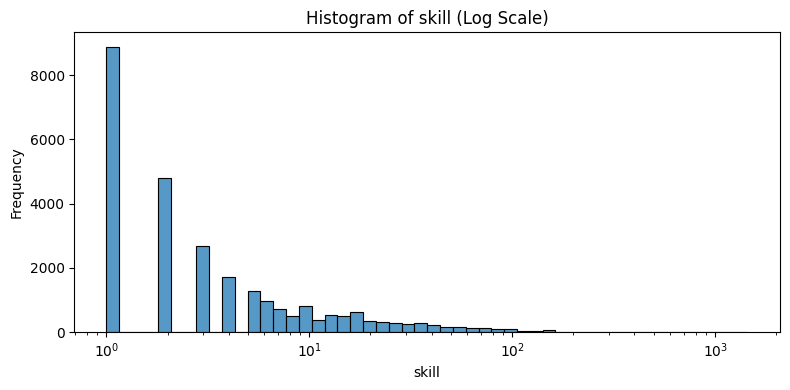

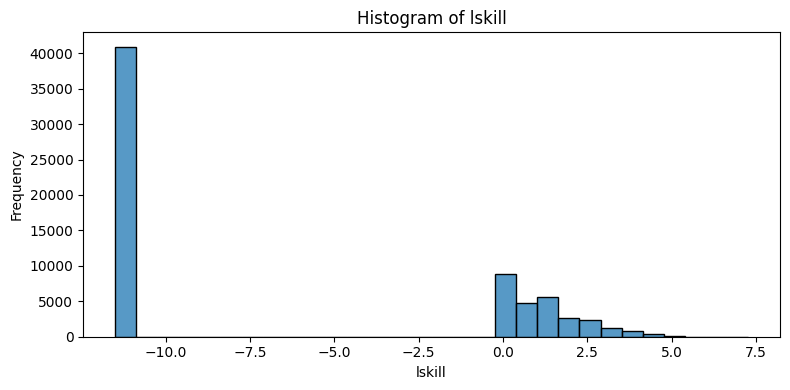

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

# Loop through numeric columns
for i, column in enumerate(df.select_dtypes(include="number").columns):
    plt.figure(figsize=(8, 4))  # Set figure size for each histogram

    # Check if the column contains zero values
    if df[column].min() == 0:
        # Add a small constant (e.g., 1) to avoid division by zero
        temp_column = df[column] + 1
    else:
        temp_column = df[column]

    # Check if the column has a wide range or skewed distribution
    if temp_column.max() / temp_column.min() > 100:  # Use log scale for highly skewed data
        sns.histplot(data=df, x=column, bins=50, log_scale=True)  # Use log scale and more bins
        plt.title(f"Histogram of {column} (Log Scale)")
    else:
        sns.histplot(data=df, x=column, bins=30)  # Use default scale and fewer bins
        plt.title(f"Histogram of {column}")

    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.tight_layout()  # Ensure proper spacing
    plt.show()

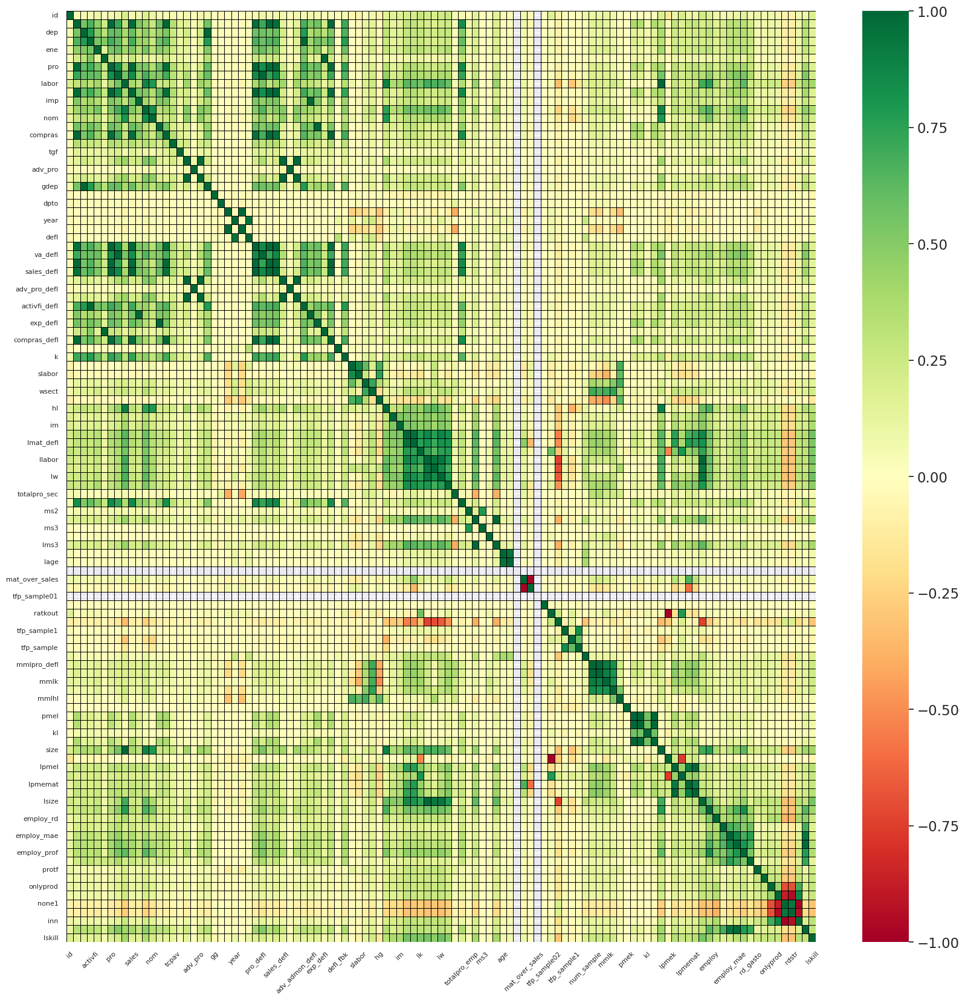

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set dynamic figure size based on the number of columns
num_cols = len(df.columns)
fig_width = min(20, num_cols * 0.5)  # Scale width but limit max size
fig_height = min(20, num_cols * 0.5)  # Scale height but limit max size

plt.figure(figsize=(fig_width, fig_height))  # Adjust figure size
sns.set(font_scale=min(1.5, 200/num_cols))  # Adjust font size dynamically

# Create heatmap with improved visibility
heat_plot = sns.heatmap(
    df.corr(method='pearson'),
    annot=False,  # Keep annotations off for readability
    cmap='RdYlGn',
    linewidths=0.5,  # Add small gaps for clarity
    linecolor='black'
)

# Rotate labels dynamically based on number of columns
plt.xticks(fontsize=max(8, 200/num_cols), rotation=45 if num_cols > 20 else 0)
plt.yticks(fontsize=max(8, 200/num_cols))

plt.show()


In [27]:
# Compute correlation of 'rdstr' with all other columns
correlation = df.corr()["rdstr"].sort_values(ascending=False)

# Display results
print(correlation)


rdstr             1.000000
none1             0.933899
ratktrab          0.194068
hg                0.041407
gg                0.032947
slabor            0.031170
tfp_sample2       0.026311
dpto              0.020797
ciiu2             0.017351
ciiu4             0.016554
defl_fbk          0.010010
va_nom            0.004249
lpmek             0.003578
pmek              0.002795
ms3               0.001931
tfp_sample02     -0.002686
kl               -0.004261
ihh              -0.006831
tfp_sample       -0.017209
ms2              -0.018551
adv_pro_defl     -0.019238
adv_pro          -0.020588
ratkout          -0.022128
tgf              -0.026201
pmemat           -0.027499
snom             -0.029343
defl             -0.031359
year             -0.032775
sales_labor      -0.038206
pmel             -0.039168
tfp_sample1      -0.044001
invbr_defl       -0.045522
invbr            -0.046445
mat_over_sales   -0.050587
lage             -0.051164
age              -0.054912
totalpro_sec     -0.060593
m

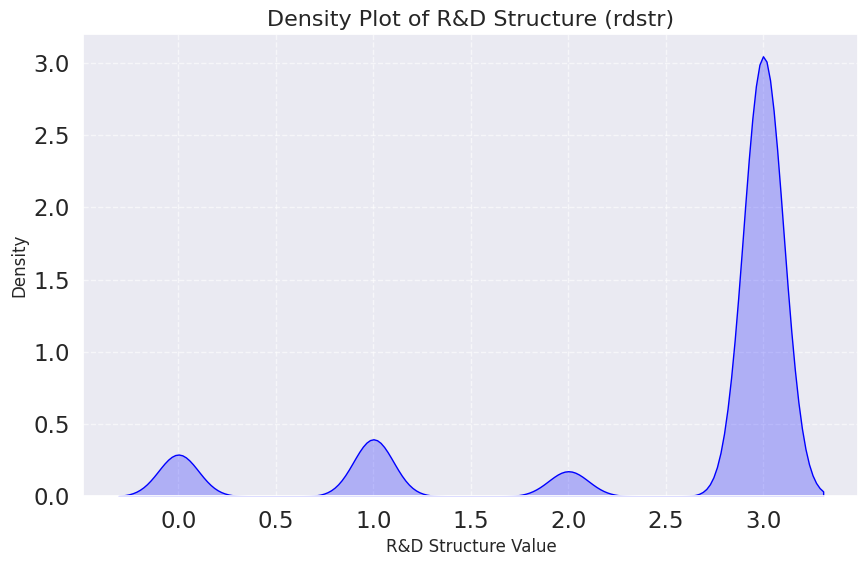

In [28]:
# Create density plot for rdstr
plt.figure(figsize=(10, 6))
sns.kdeplot(df["rdstr"], fill=True, color="blue")
plt.title("Density Plot of R&D Structure (rdstr)", fontsize=16)
plt.xlabel("R&D Structure Value", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

<Figure size 1500x1000 with 0 Axes>

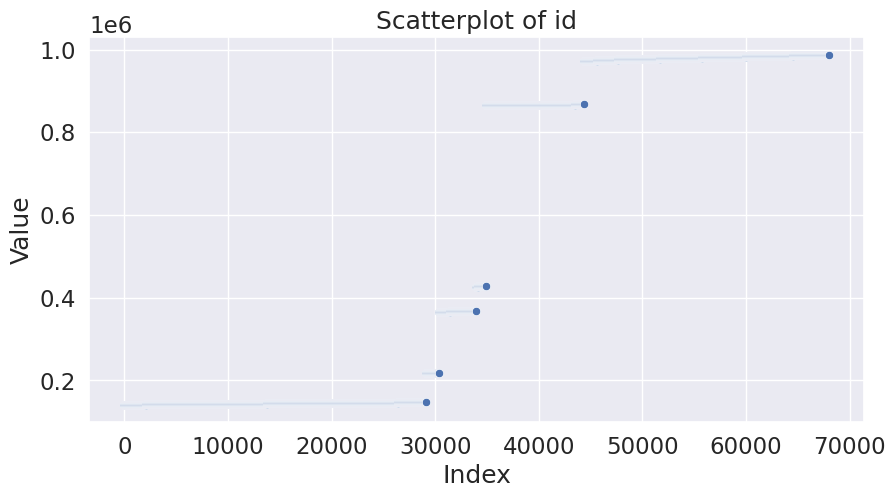

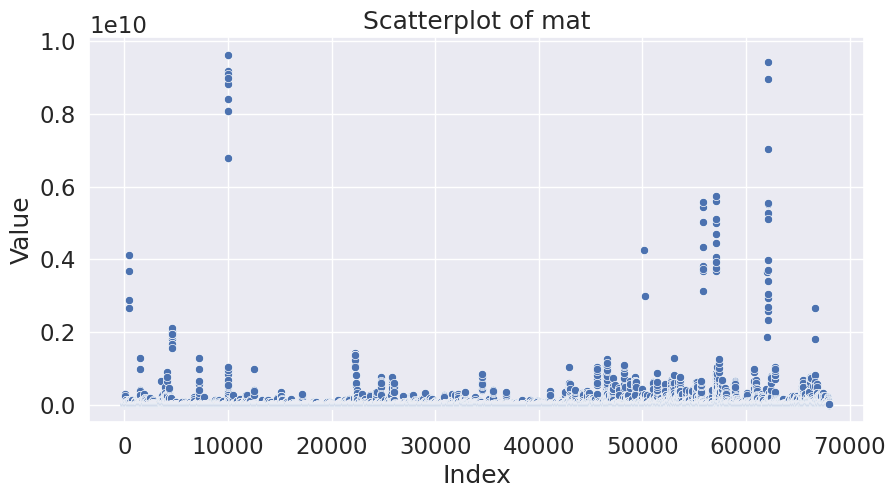

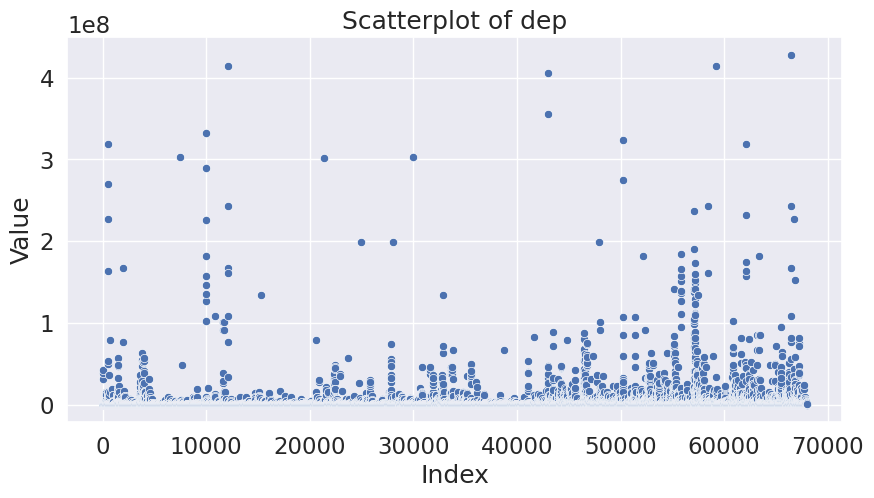

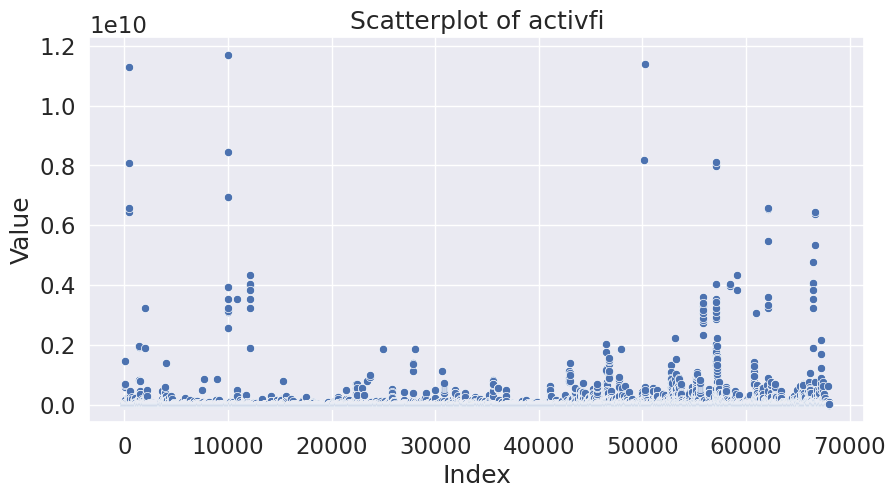

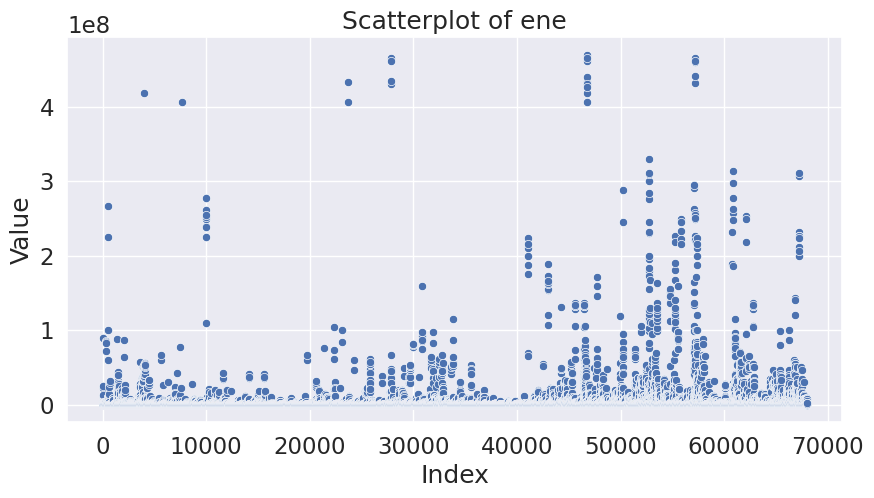

...

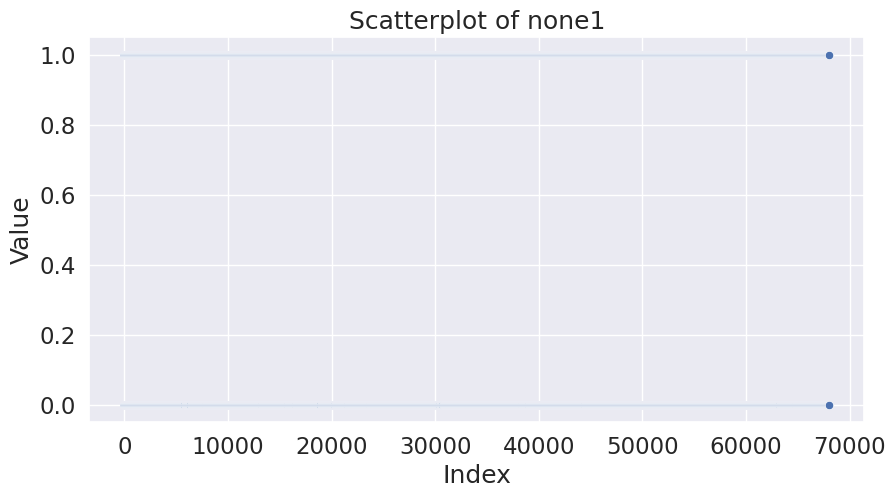

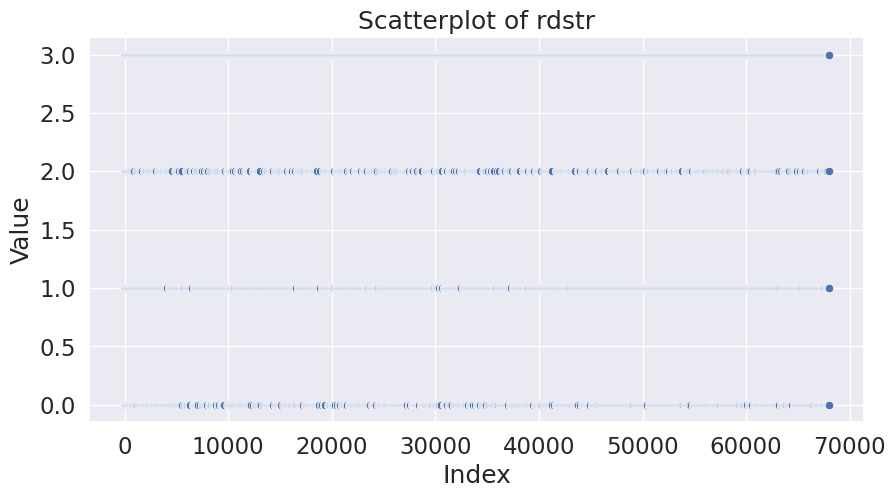

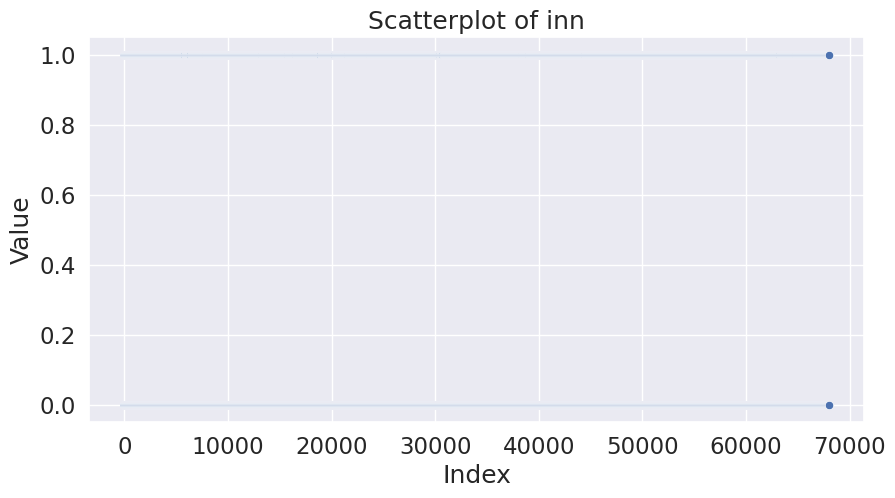

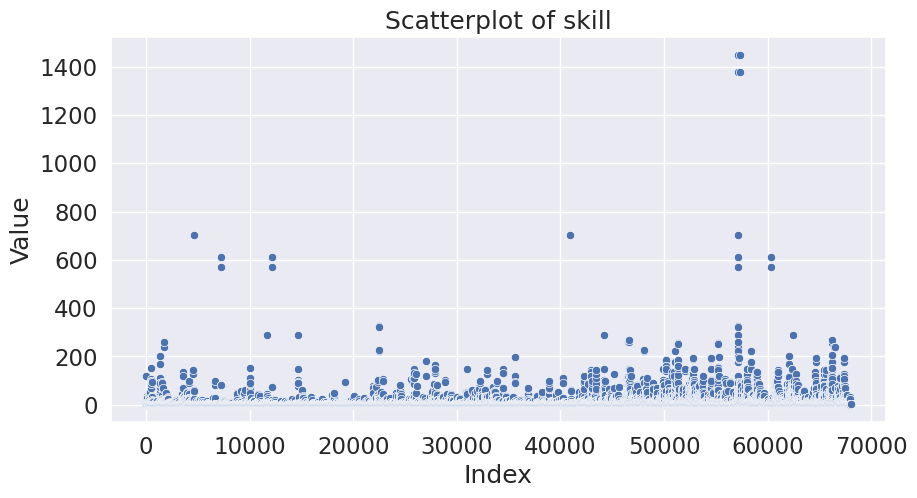

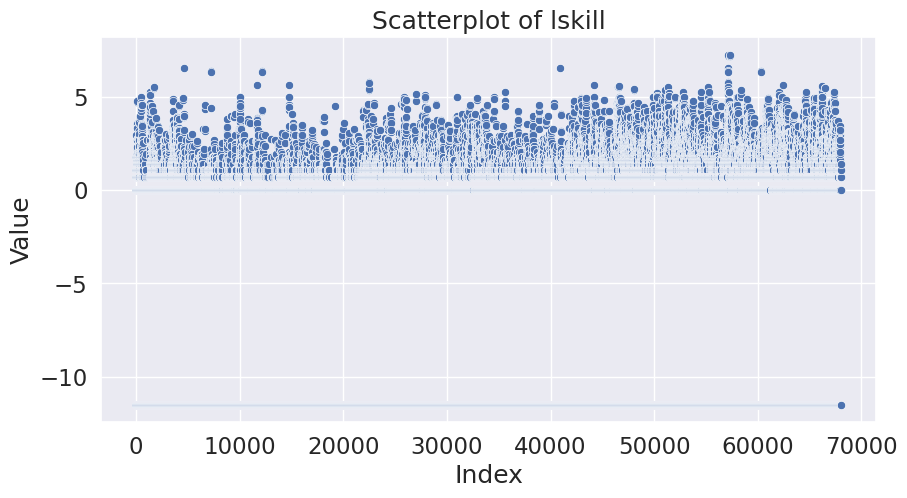

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set figure size for better visibility
plt.figure(figsize=(15, 10))

# Loop through all columns and create scatterplots
for column in df.columns:
    plt.figure(figsize=(10, 5))  # Set size for each plot
    sns.scatterplot(x=df.index, y=df[column])  # Scatterplot for each column
    plt.title(f"Scatterplot of {column}")
    plt.xlabel("Index")
    plt.ylabel("Value")
    plt.show()  # Show each plot separately


In [30]:
# Check unique values and missing values for 'allvars' and 'tfp_sample01'
print("Unique values in 'allvars':", df["allvars"].unique())
print("Missing values in 'allvars':", df["allvars"].isnull().sum())

print("Unique values in 'tfp_sample01':", df["tfp_sample01"].unique())
print("Missing values in 'tfp_sample01':", df["tfp_sample01"].isnull().sum())

Unique values in 'allvars': [1]
Missing values in 'allvars': 0
Unique values in 'tfp_sample01': [1]
Missing values in 'tfp_sample01': 0


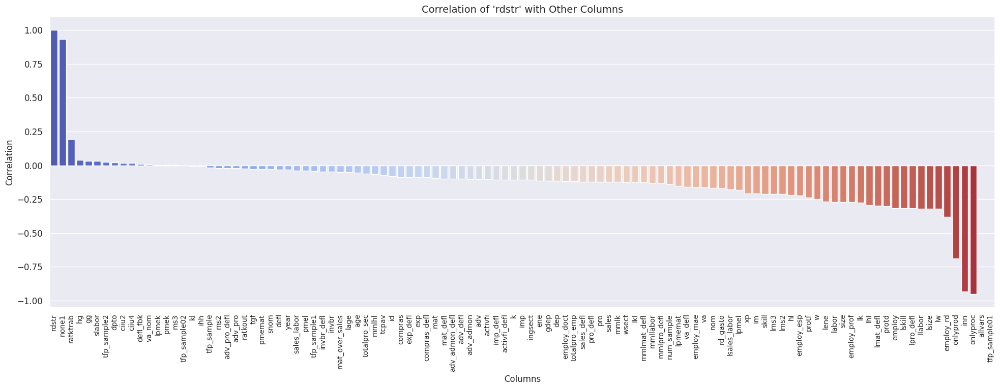

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 8))  # Increase width for better spacing
sns.barplot(x=correlation.index, y=correlation.values, palette="coolwarm")

plt.xticks(rotation=90, fontsize=10)  # Rotate labels & reduce font size
plt.yticks(fontsize=12)  # Adjust y-axis font size

plt.title("Correlation of 'rdstr' with Other Columns", fontsize=14)
plt.xlabel("Columns", fontsize=12)
plt.ylabel("Correlation", fontsize=12)

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


In [32]:
#Dropping these columns as they have very low correlation with rdstr
# List of columns to drop
columns_to_drop = ["va_nom", "lpmek", "pmek", "ms3", "tfp_sample02", "kl", "ihh","allvars","tfp_sample01"]

# Drop the columns
df.drop(columns=columns_to_drop, inplace=True)

# Verify the changes
print("Updated DataFrame Columns:")
print(df.columns)


Updated DataFrame Columns:
Index(['id', 'mat', 'dep', 'activfi', 'ene', 'invbr', 'pro', 'va', 'labor',
       'sales', 'imp', 'w', 'nom', 'exp', 'compras', 'tcpav', 'tgf', 'adv',
       'adv_pro', 'adv_admon', 'gdep', 'gg', 'dpto', 'ciiu4', 'year', 'ciiu2',
       'defl', 'pro_defl', 'va_defl', 'mat_defl', 'sales_defl', 'adv_defl',
       'adv_pro_defl', 'adv_admon_defl', 'activfi_defl', 'imp_defl',
       'exp_defl', 'invbr_defl', 'compras_defl', 'defl_fbk', 'k', 'snom',
       'slabor', 'ingsect', 'wsect', 'hg', 'hl', 'xp', 'im', 'lpro_defl',
       'lmat_defl', 'lk', 'llabor', 'lhl', 'lw', 'lene', 'totalpro_sec',
       'totalpro_emp', 'ms2', 'lms2', 'lms3', 'age', 'lage', 'mat_over_sales',
       'ratkout', 'ratktrab', 'tfp_sample1', 'tfp_sample2', 'tfp_sample',
       'num_sample', 'mmlpro_defl', 'mmlmat_defl', 'mmlk', 'mmllabor', 'mmlhl',
       'pmel', 'pmemat', 'sales_labor', 'size', 'lpmel', 'lkl', 'lpmemat',
       'lsales_labor', 'lsize', 'employ', 'employ_rd', 'employ_doct'

In [33]:
# Compute correlation of 'rdstr' with all other columns
correlation = df.corr()["rdstr"].sort_values(ascending=False)

# Display results
print(correlation)


rdstr             1.000000
none1             0.933899
ratktrab          0.194068
hg                0.041407
gg                0.032947
slabor            0.031170
tfp_sample2       0.026311
dpto              0.020797
ciiu2             0.017351
ciiu4             0.016554
defl_fbk          0.010010
tfp_sample       -0.017209
ms2              -0.018551
adv_pro_defl     -0.019238
adv_pro          -0.020588
ratkout          -0.022128
tgf              -0.026201
pmemat           -0.027499
snom             -0.029343
defl             -0.031359
year             -0.032775
sales_labor      -0.038206
pmel             -0.039168
tfp_sample1      -0.044001
invbr_defl       -0.045522
invbr            -0.046445
mat_over_sales   -0.050587
lage             -0.051164
age              -0.054912
totalpro_sec     -0.060593
mmlhl            -0.066663
tcpav            -0.072079
id               -0.080277
compras          -0.088072
exp_defl         -0.088259
exp              -0.088620
compras_defl     -0.088637
m

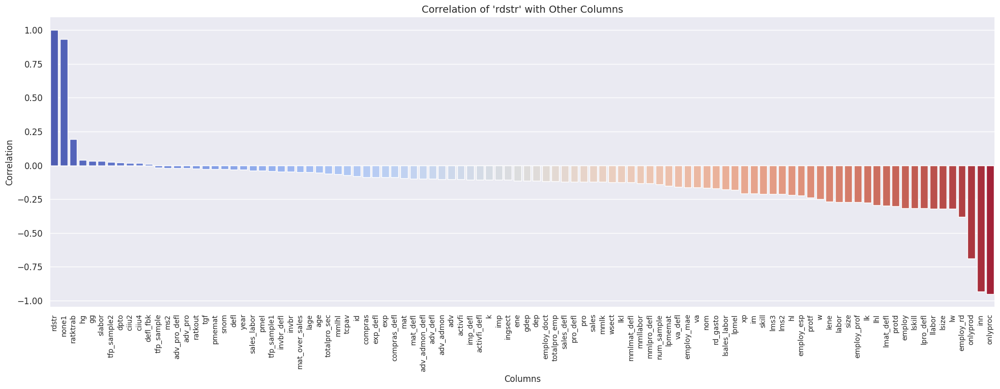

In [34]:
plt.figure(figsize=(20, 8))  # Increase width for better spacing
sns.barplot(x=correlation.index, y=correlation.values, palette="coolwarm")

plt.xticks(rotation=90, fontsize=10)  # Rotate labels & reduce font size
plt.yticks(fontsize=12)  # Adjust y-axis font size

plt.title("Correlation of 'rdstr' with Other Columns", fontsize=14)
plt.xlabel("Columns", fontsize=12)
plt.ylabel("Correlation", fontsize=12)

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


In [35]:
df.shape

(68015, 100)

In [36]:
import numpy as np

def find_outliers_iqr(df):
    outlier_dict = {}  # Dictionary to store outlier counts per column

    for column in df.select_dtypes(include=np.number).columns:  # Select only numeric columns
        Q1 = df[column].quantile(0.25)  # 25th percentile
        Q3 = df[column].quantile(0.75)  # 75th percentile
        IQR = Q3 - Q1  # Interquartile Range

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Find outliers in the original dataset
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        outlier_count = outliers.shape[0]

        # Store in dictionary
        outlier_dict[column] = outlier_count

    return outlier_dict

# Detect outliers in all numeric columns
outliers = find_outliers_iqr(df)

# Print outlier count per column
print("Outlier Counts per Column:")
for col, count in outliers.items():
    print(f"{col}: {count} outliers")



Outlier Counts per Column:
id: 0 outliers
mat: 10574 outliers
dep: 10516 outliers
activfi: 10589 outliers
ene: 10745 outliers
invbr: 12211 outliers
pro: 10372 outliers
va: 10198 outliers
labor: 7899 outliers
sales: 10324 outliers
imp: 14687 outliers
w: 8847 outliers
nom: 11544 outliers
exp: 15110 outliers
compras: 10754 outliers
tcpav: 10326 outliers
tgf: 9956 outliers
adv: 11841 outliers
adv_pro: 6339 outliers
adv_admon: 11862 outliers
gdep: 10516 outliers
gg: 1797 outliers
dpto: 142 outliers
ciiu4: 167 outliers
year: 0 outliers
ciiu2: 167 outliers
defl: 0 outliers
pro_defl: 10398 outliers
va_defl: 10151 outliers
mat_defl: 10506 outliers
sales_defl: 10341 outliers
adv_defl: 11778 outliers
adv_pro_defl: 6339 outliers
adv_admon_defl: 11819 outliers
activfi_defl: 10573 outliers
imp_defl: 14687 outliers
exp_defl: 15120 outliers
invbr_defl: 12129 outliers
compras_defl: 10727 outliers
defl_fbk: 0 outliers
k: 10588 outliers
snom: 1885 outliers
slabor: 6391 outliers
ingsect: 3498 outliers
wse

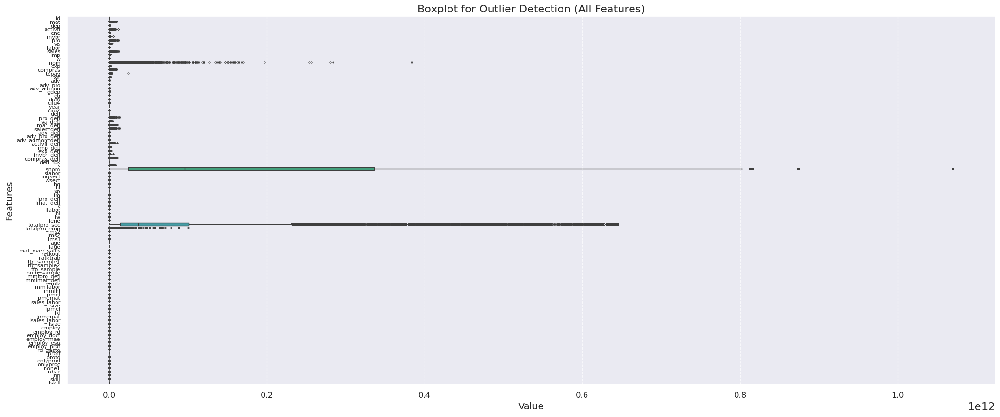

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(25, 10))  # Increase figure size for better visibility

# Create a boxplot for all numeric columns
sns.boxplot(data=df, orient="h", fliersize=2)  # Horizontal orientation, smaller outlier markers

plt.title("Boxplot for Outlier Detection (All Features)", fontsize=16)
plt.xlabel("Value", fontsize=14)
plt.ylabel("Features", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=8)  # Reduce y-tick size for readability with 125 features
plt.grid(axis="x", linestyle="--", alpha=0.7)  # Add grid only on x-axis for better clarity

plt.show()


In [38]:
# Select numeric columns
numeric_columns = df.select_dtypes(include=[np.number]).columns

# Calculate IQR for each numeric column
Q1 = df[numeric_columns].quantile(0.25)
Q3 = df[numeric_columns].quantile(0.75)
IQR = Q3 - Q1

# Define outliers (values below Q1 - 1.5*IQR or above Q3 + 1.5*IQR)
outliers = (df[numeric_columns] < (Q1 - 1.5 * IQR)) | ((df[numeric_columns] > (Q3 + 1.5 * IQR)))

# Summarize outliers
outlier_summary = outliers.sum()
print("Number of outliers per column:")
print(outlier_summary)


Number of outliers per column:
id                    0
mat               10574
dep               10516
activfi           10589
ene               10745
invbr             12211
pro               10372
va                10198
labor              7899
sales             10324
imp               14687
w                  8847
nom               11544
exp               15110
compras           10754
tcpav             10326
tgf                9956
adv               11841
adv_pro            6339
adv_admon         11862
gdep              10516
gg                 1797
dpto                142
ciiu4               167
year                  0
ciiu2               167
defl                  0
pro_defl          10398
va_defl           10151
mat_defl          10506
sales_defl        10341
adv_defl          11778
adv_pro_defl       6339
adv_admon_defl    11819
activfi_defl      10573
imp_defl          14687
exp_defl          15120
invbr_defl        12129
compras_defl      10727
defl_fbk              0
k        

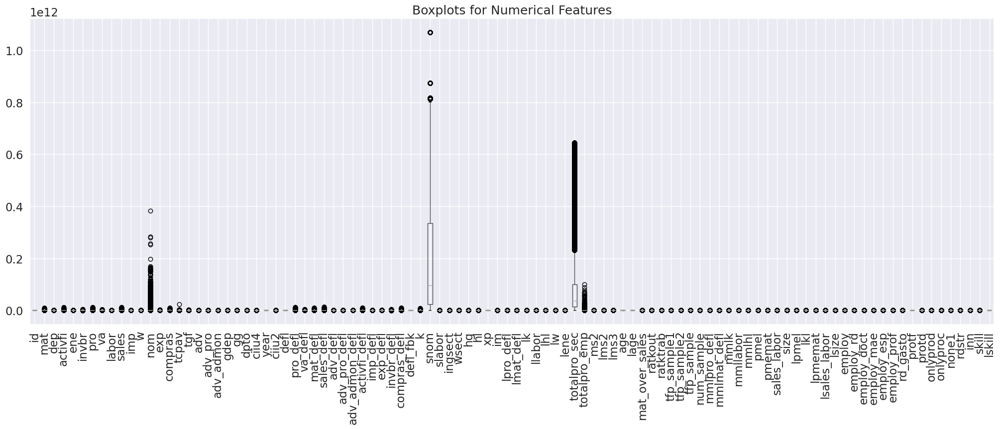

In [39]:
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Plot boxplots for all numeric columns
plt.figure(figsize=(25, 8))
df[numeric_cols].boxplot(rot=90)  # Rotate labels for better readability
plt.title("Boxplots for Numerical Features")
plt.show()

In [40]:
import pandas as pd
import numpy as np
from scipy.stats import zscore

#As there are too many outliers using IQR, we have decided to take an alternative approach of finding outlier with z-score
def find_outliers_zscore(df, threshold=3):
    outlier_dict = {}  # Dictionary to store outlier counts per column

    for column in df.select_dtypes(include=np.number).columns:  # Select only numeric columns
        z_scores = np.abs(zscore(df[column]))  # Compute absolute Z-scores
        outliers = df[z_scores > threshold]  # Find outliers with Z-score > threshold
        outlier_count = outliers.shape[0]  # Count outliers

        outlier_dict[column] = outlier_count  # Store result

    return outlier_dict

# Detect outliers in all numeric columns using Z-score
outliers = find_outliers_zscore(df)

# Print outlier count per column
print("Outlier Counts per Column (Z-score method):")
for col, count in outliers.items():
    print(f"{col}: {count} outliers")


Outlier Counts per Column (Z-score method):
id: 0 outliers
mat: 307 outliers
dep: 445 outliers
activfi: 354 outliers
ene: 536 outliers
invbr: 95 outliers
pro: 405 outliers
va: 664 outliers
labor: 1376 outliers
sales: 410 outliers
imp: 445 outliers
w: 1232 outliers
nom: 805 outliers
exp: 442 outliers
compras: 270 outliers
tcpav: 254 outliers
tgf: 38 outliers
adv: 459 outliers
adv_pro: 54 outliers
adv_admon: 459 outliers
gdep: 445 outliers
gg: 1797 outliers
dpto: 0 outliers
ciiu4: 167 outliers
year: 0 outliers
ciiu2: 167 outliers
defl: 0 outliers
pro_defl: 404 outliers
va_defl: 608 outliers
mat_defl: 305 outliers
sales_defl: 401 outliers
adv_defl: 453 outliers
adv_pro_defl: 46 outliers
adv_admon_defl: 453 outliers
activfi_defl: 384 outliers
imp_defl: 449 outliers
exp_defl: 440 outliers
invbr_defl: 92 outliers
compras_defl: 270 outliers
defl_fbk: 0 outliers
k: 361 outliers
snom: 665 outliers
slabor: 0 outliers
ingsect: 1380 outliers
wsect: 871 outliers
hg: 76 outliers
hl: 1104 outliers
xp

In [41]:
from sklearn.neighbors import LocalOutlierFactor

# Select numeric columns
numeric_columns = df.select_dtypes(include=np.number).columns

# Apply Local Outlier Factor (LOF)
lof = LocalOutlierFactor(n_neighbors=20)  # Adjust n_neighbors as needed
outliers_lof = lof.fit_predict(df[numeric_columns])

# Create a new column for outliers (-1 means outlier, 1 means inlier)
df['Outlier'] = outliers_lof

# Remove outliers (keep only inliers)
df_cleaned = df[df['Outlier'] == 1].drop(columns=['Outlier'])  # Drop the outlier column

# Show the number of removed rows
print(f"Outliers removed using LOF: {df.shape[0] - df_cleaned.shape[0]}")

# Display the cleaned DataFrame
df_cleaned.head()


Outliers removed using LOF: 4859


,id,mat,dep,activfi,ene,invbr,pro,va,labor,sales,imp,w,nom,exp,compras,tcpav,tgf,adv,adv_pro,adv_admon,gdep,gg,dpto,ciiu4,year,ciiu2,defl,pro_defl,va_defl,mat_defl,sales_defl,adv_defl,adv_pro_defl,adv_admon_defl,activfi_defl,imp_defl,exp_defl,invbr_defl,compras_defl,defl_fbk,k,snom,slabor,ingsect,wsect,hg,hl,xp,im,lpro_defl,lmat_defl,lk,llabor,lhl,lw,lene,totalpro_sec,totalpro_emp,ms2,lms2,lms3,age,lage,mat_over_sales,ratkout,ratktrab,tfp_sample1,tfp_sample2,tfp_sample,num_sample,mmlpro_defl,mmlmat_defl,mmlk,mmllabor,mmlhl,pmel,pmemat,sales_labor,size,lpmel,lkl,lpmemat,lsales_labor,lsize,employ,employ_rd,employ_doct,employ_mae,employ_esp,employ_prof,rd_gasto,protf,protd,onlyprod,onlyproc,none1,rdstr,inn,skill,lskill
0,141348,1179437.0,703922.0,2129049.0,523393.0,1268884.0,1624427.0,444990.0,100,8295581.0,0.0,2258306.0,2.258306e+08,0.0,783454.0,2868358.0,28222.0,40533.0,0.0,40533.0,703922.0,0,66,1081,2019,10,118.68,1368745.0,374949.4,993795.9,6989873.0,34153.180,0.0,34153.180,1793941.0,0.0,0.0,1069164.00,660139.9,100.96,1411576.0,2.610000e+11,29306,8915730.0,1846463.0,4.828546,482.85460,0,0,14.12941,13.80929,14.16022,4.605170,6.179716,14.63013,13.168090,8.520000e+10,24600000.0,0.028804,-3.547229,-7.094458,2,0.693147,0.977344,1.002181,3.074852,1,1,1,4,14.35704,13.68538,13.18354,3.348062,5.085099,13687.45,9937.959,69898.73,100,9.524235,9.555047,9.204117,11.15480,4.605170,100,0,0,0,2,5,0.0,0,1,0,0,1,3,0,2,0.693152
1,141348,1099479.0,231338.0,2239137.0,479172.0,110088.0,8259581.0,7160102.0,13,8259581.0,0.0,475270.0,6.178510e+06,0.0,759950.0,2.0,64.0,22811.0,0.0,22811.0,231338.0,0,66,1081,2020,10,109.89,7516227.0,6515700.0,1000527.0,7516227.0,20758.030,0.0,20758.030,2037617.0,0.0,0.0,100180.20,691555.2,79.69,2383906.0,2.430000e+11,26558,9145062.0,1765530.0,5.179782,67.33717,0,0,15.83257,13.81604,14.68425,2.564949,4.209713,13.07164,13.079810,1.340000e+11,7516227.0,0.005628,-5.180072,-10.360150,4,1.386294,0.872634,0.927471,5.724967,1,1,1,4,14.35704,13.68538,13.18354,3.348062,5.085099,578171.30,76963.610,578171.30,13,13.267630,12.119300,11.251090,13.26763,2.564949,112,0,0,0,2,5,0.0,0,1,0,0,1,3,0,2,0.693152
2,141349,26049028.0,3215151.0,64502449.0,1375400.0,901898.0,42211502.0,16162474.0,212,44045647.0,3297764.0,8271887.0,1.753640e+09,23623266.0,19514563.0,16412824.0,36270.0,12643.0,0.0,12643.0,3215151.0,0,13,2221,2020,22,109.89,38400000.0,14700000.0,23700000.0,40100000.0,11505.140,0.0,11505.140,58700000.0,3000968.0,21500000.0,820728.00,17800000.0,79.69,76900000.0,2.420000e+11,17457,13900000.0,4381852.0,3.165694,671.12710,1,1,17.46389,16.98118,18.15811,5.356586,6.508958,15.92837,14.134260,6.230000e+10,87300000.0,0.140009,-1.966047,-3.932094,2,0.693147,0.972359,1.039752,3.389866,1,1,1,3,15.71765,15.23649,14.96569,3.917237,5.133423,181191.10,111814.300,189064.10,212,12.107310,12.801520,11.624590,12.14984,5.356586,212,3,0,6,14,32,21000.0,0,1,1,1,0,0,1,20,2.995733
3,141350,7648158.0,546259.0,1316816.0,12900.0,53469.0,9454825.0,1806667.0,29,9454825.0,0.0,1125752.0,3.264681e+07,0.0,1100692.0,6839920.0,72824.0,0.0,0.0,0.0,546259.0,0,5,3290,2019,32,118.68,7966654.0,1522301.0,6444353.0,7966654.0,0.000,0.0,0.000,1109552.0,0.0,0.0,45053.08,927445.3,100.96,763230.0,3.730000e+11,35332,10600000.0,2665061.0,3.961486,114.88310,0,0,15.89077,15.67871,13.54531,3.367296,4.743915,13.93396,9.464983,2.510000e+11,7966654.0,0.003179,-5.751192,-11.502380,1,0.000010,0.986655,0.852401,4.022609,1,1,1,4,14.84482,14.03219,14.17453,3.433146,4.850585,274712.20,222219.100,274712.20,29,12.523480,10.178020,12.311420,12.52348,3.367296,131,19,0,0,3,15,3197312.0,0,1,0,0,1,3,0,3,1.098616
4,141350,5353710.0,195033.0,2128381.0,8772.0,811565.0,6618378.0,1264668.0,21,6618378.0,0.0,930745.0,1.954564e+07,0.0,770484.0,5027336.0,13734.0,4564.0,0.0,4564.0,195033.0,0,5,3290,2020,32,109.89,6022730.0,1150849.0,4871881.0,6022730.0,4153.244,0.0,4153.244,1936829.0,0.0,0.0,738524.90,701141.1,79.69,755925.5,3.620000e+11,34964,10400000.0,2726374.0,3.802145,79.84504,0,0,15.61105,15.39899,13.535

In [42]:
df_cleaned.shape
#We have used IQR,zscore method and LOF to find outliers. Finally we decided to drop outliers rows by using LOF

(63156, 100)

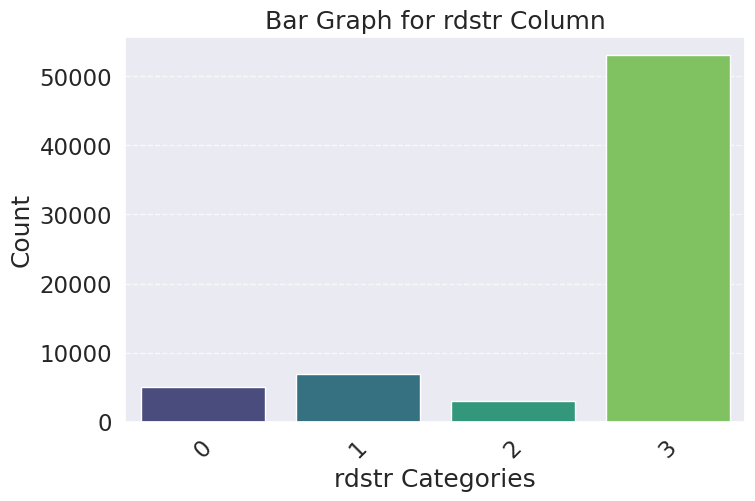

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count the frequency of each unique value in 'rdstr'
rdstr_counts = df['rdstr'].value_counts()

# Plot the bar chart
plt.figure(figsize=(8, 5))
sns.barplot(x=rdstr_counts.index, y=rdstr_counts.values, palette="viridis")

# Labels and Title
plt.xlabel("rdstr Categories")
plt.ylabel("Count")
plt.title("Bar Graph for rdstr Column")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()


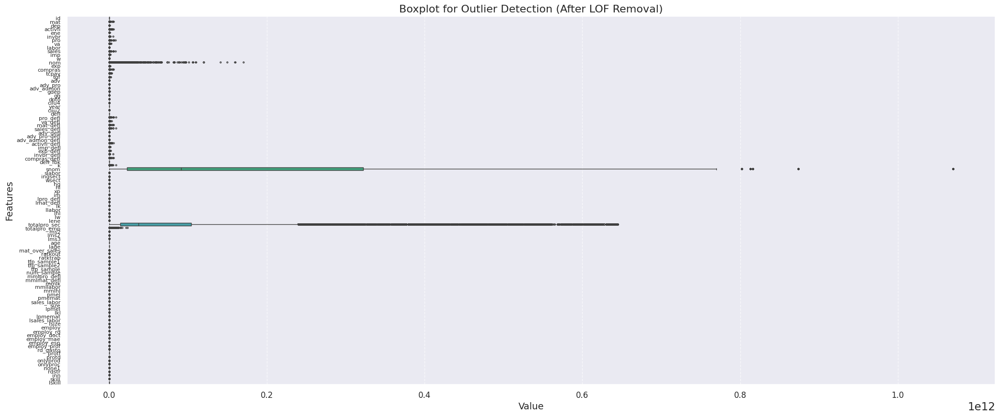

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set figure size for better visibility
plt.figure(figsize=(25, 10))

# Create a boxplot for all numeric columns
sns.boxplot(data=df_cleaned, orient="h", fliersize=2)  # Horizontal orientation, smaller outlier markers

# Customize the plot
plt.title("Boxplot for Outlier Detection (After LOF Removal)", fontsize=16)
plt.xlabel("Value", fontsize=14)
plt.ylabel("Features", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=8)  # Reduce y-tick size for readability with many features
plt.grid(axis="x", linestyle="--", alpha=0.7)  # Add grid only on x-axis for clarity

plt.show()


In [45]:
from sklearn.neighbors import LocalOutlierFactor

# Select numeric columns from the cleaned dataset
numeric_columns_cleaned = df_cleaned.select_dtypes(include=np.number).columns

# Apply LOF again to detect any remaining outliers
lof = LocalOutlierFactor(n_neighbors=20)  # Adjust n_neighbors as needed
outliers_lof_cleaned = lof.fit_predict(df_cleaned[numeric_columns_cleaned])

# Count remaining outliers (-1 means outlier)
remaining_outliers = (outliers_lof_cleaned == -1).sum()

print(f"Remaining outliers detected using LOF: {remaining_outliers}")


Remaining outliers detected using LOF: 852


In [46]:
# Add LOF outlier detection results to df_cleaned
df_cleaned["Outlier"] = outliers_lof_cleaned  # -1 means outlier, 1 means inlier

# Remove the outliers (keep only inliers)
df_final = df_cleaned[df_cleaned["Outlier"] == 1].drop(columns=["Outlier"])  # Drop the "Outlier" column

# Show the number of removed rows
print(f"Outliers removed after second LOF check: {df_cleaned.shape[0] - df_final.shape[0]}")

# Display the final cleaned DataFrame
df_final.head()


Outliers removed after second LOF check: 852


,id,mat,dep,activfi,ene,invbr,pro,va,labor,sales,imp,w,nom,exp,compras,tcpav,tgf,adv,adv_pro,adv_admon,gdep,gg,dpto,ciiu4,year,ciiu2,defl,pro_defl,va_defl,mat_defl,sales_defl,adv_defl,adv_pro_defl,adv_admon_defl,activfi_defl,imp_defl,exp_defl,invbr_defl,compras_defl,defl_fbk,k,snom,slabor,ingsect,wsect,hg,hl,xp,im,lpro_defl,lmat_defl,lk,llabor,lhl,lw,lene,totalpro_sec,totalpro_emp,ms2,lms2,lms3,age,lage,mat_over_sales,ratkout,ratktrab,tfp_sample1,tfp_sample2,tfp_sample,num_sample,mmlpro_defl,mmlmat_defl,mmlk,mmllabor,mmlhl,pmel,pmemat,sales_labor,size,lpmel,lkl,lpmemat,lsales_labor,lsize,employ,employ_rd,employ_doct,employ_mae,employ_esp,employ_prof,rd_gasto,protf,protd,onlyprod,onlyproc,none1,rdstr,inn,skill,lskill
0,141348,1179437.0,703922.0,2129049.0,523393.0,1268884.0,1624427.0,444990.0,100,8295581.0,0.0,2258306.0,2.258306e+08,0.0,783454.0,2868358.0,28222.0,40533.0,0.0,40533.0,703922.0,0,66,1081,2019,10,118.68,1368745.0,374949.4,993795.9,6989873.0,34153.180,0.0,34153.180,1793941.0,0.0,0.0,1069164.00,660139.9,100.96,1411576.0,2.610000e+11,29306,8915730.0,1846463.0,4.828546,482.85460,0,0,14.12941,13.80929,14.16022,4.605170,6.179716,14.63013,13.168090,8.520000e+10,24600000.0,0.028804,-3.547229,-7.094458,2,0.693147,0.977344,1.002181,3.074852,1,1,1,4,14.35704,13.68538,13.18354,3.348062,5.085099,13687.45,9937.959,69898.73,100,9.524235,9.555047,9.204117,11.15480,4.605170,100,0,0,0,2,5,0.0,0,1,0,0,1,3,0,2,0.693152
1,141348,1099479.0,231338.0,2239137.0,479172.0,110088.0,8259581.0,7160102.0,13,8259581.0,0.0,475270.0,6.178510e+06,0.0,759950.0,2.0,64.0,22811.0,0.0,22811.0,231338.0,0,66,1081,2020,10,109.89,7516227.0,6515700.0,1000527.0,7516227.0,20758.030,0.0,20758.030,2037617.0,0.0,0.0,100180.20,691555.2,79.69,2383906.0,2.430000e+11,26558,9145062.0,1765530.0,5.179782,67.33717,0,0,15.83257,13.81604,14.68425,2.564949,4.209713,13.07164,13.079810,1.340000e+11,7516227.0,0.005628,-5.180072,-10.360150,4,1.386294,0.872634,0.927471,5.724967,1,1,1,4,14.35704,13.68538,13.18354,3.348062,5.085099,578171.30,76963.610,578171.30,13,13.267630,12.119300,11.251090,13.26763,2.564949,112,0,0,0,2,5,0.0,0,1,0,0,1,3,0,2,0.693152
2,141349,26049028.0,3215151.0,64502449.0,1375400.0,901898.0,42211502.0,16162474.0,212,44045647.0,3297764.0,8271887.0,1.753640e+09,23623266.0,19514563.0,16412824.0,36270.0,12643.0,0.0,12643.0,3215151.0,0,13,2221,2020,22,109.89,38400000.0,14700000.0,23700000.0,40100000.0,11505.140,0.0,11505.140,58700000.0,3000968.0,21500000.0,820728.00,17800000.0,79.69,76900000.0,2.420000e+11,17457,13900000.0,4381852.0,3.165694,671.12710,1,1,17.46389,16.98118,18.15811,5.356586,6.508958,15.92837,14.134260,6.230000e+10,87300000.0,0.140009,-1.966047,-3.932094,2,0.693147,0.972359,1.039752,3.389866,1,1,1,3,15.71765,15.23649,14.96569,3.917237,5.133423,181191.10,111814.300,189064.10,212,12.107310,12.801520,11.624590,12.14984,5.356586,212,3,0,6,14,32,21000.0,0,1,1,1,0,0,1,20,2.995733
3,141350,7648158.0,546259.0,1316816.0,12900.0,53469.0,9454825.0,1806667.0,29,9454825.0,0.0,1125752.0,3.264681e+07,0.0,1100692.0,6839920.0,72824.0,0.0,0.0,0.0,546259.0,0,5,3290,2019,32,118.68,7966654.0,1522301.0,6444353.0,7966654.0,0.000,0.0,0.000,1109552.0,0.0,0.0,45053.08,927445.3,100.96,763230.0,3.730000e+11,35332,10600000.0,2665061.0,3.961486,114.88310,0,0,15.89077,15.67871,13.54531,3.367296,4.743915,13.93396,9.464983,2.510000e+11,7966654.0,0.003179,-5.751192,-11.502380,1,0.000010,0.986655,0.852401,4.022609,1,1,1,4,14.84482,14.03219,14.17453,3.433146,4.850585,274712.20,222219.100,274712.20,29,12.523480,10.178020,12.311420,12.52348,3.367296,131,19,0,0,3,15,3197312.0,0,1,0,0,1,3,0,3,1.098616
4,141350,5353710.0,195033.0,2128381.0,8772.0,811565.0,6618378.0,1264668.0,21,6618378.0,0.0,930745.0,1.954564e+07,0.0,770484.0,5027336.0,13734.0,4564.0,0.0,4564.0,195033.0,0,5,3290,2020,32,109.89,6022730.0,1150849.0,4871881.0,6022730.0,4153.244,0.0,4153.244,1936829.0,0.0,0.0,738524.90,701141.1,79.69,755925.5,3.620000e+11,34964,10400000.0,2726374.0,3.802145,79.84504,0,0,15.61105,15.39899,13.535

In [47]:
df_final.shape

(62304, 100)

In [48]:
df_final.describe()

,id,mat,dep,activfi,ene,invbr,pro,va,labor,sales,imp,w,nom,exp,compras,tcpav,tgf,adv,adv_pro,adv_admon,gdep,gg,dpto,ciiu4,year,ciiu2,defl,pro_defl,va_defl,mat_defl,sales_defl,adv_defl,adv_pro_defl,adv_admon_defl,activfi_defl,imp_defl,exp_defl,invbr_defl,compras_defl,defl_fbk,k,snom,slabor,ingsect,wsect,hg,hl,xp,im,lpro_defl,lmat_defl,lk,llabor,lhl,lw,lene,totalpro_sec,totalpro_emp,ms2,lms2,lms3,age,lage,mat_over_sales,ratkout,ratktrab,tfp_sample1,tfp_sample2,tfp_sample,num_sample,mmlpro_defl,mmlmat_defl,mmlk,mmllabor,mmlhl,pmel,pmemat,sales_labor,size,lpmel,lkl,lpmemat,lsales_labor,lsize,employ,employ_rd,employ_doct,employ_mae,employ_esp,employ_prof,rd_gasto,protf,protd,onlyprod,onlyproc,none1,rdstr,inn,skill,lskill
count,62304.000000,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,62304.000000,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,6.230400e+04,62304.000000,6.230400e+04,6.230400e+04,62304.000000,6.230400e+04,6.230400e+04,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,6.230400e+04,6.230400e+04,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,6.230400e+04,6.230400e+04,6.230400e+04,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,6.230400e+04,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000,62304.000000
mean,540472.042180,9.354264e+06,5.301253e+05,8.973467e+06,9.616909e+05,7.474284e+05,1.500032e+07,5.645684e+06,62.548376,1.468157e+07,1.802782e+06,1.434436e+06,3.434770e+08,2.076160e+06,8.241458e+06,5.084873e+06,2.125225e+05,1.760848e+05,2.147016e+03,1.739398e+05,5.301253e+05,0.027414,25.808070,2041.670150,2015.698029,20.034813,101.273898,1.469329e+07,5.530732e+06,9.161760e+06,1.437436e+07,1.739224e+05,2.181632e+03,1.717380e+05,8.748283e+06,1.766421e+06,2.025629e+06,7.252872e+05,8.070275e+06,94.469564,8.961422e+06,1.926876e+11,20668.543079,7.684407e+06,2.175337e+06,3.754334,223.688037,0.256179,0.185333,14.833966,14.126532,13.824129,3.437437,4.656782,13.209308,11.427916,9.770131e+10,8.822631e+07,0.958888,-3.316914,-6.633827,5.326512,1.445302,0.951345,0.932998,4.418373,0.980354,0.995056,0.977642,9.645127,15.005146,14.295630,14.019754,3.568315,4.766413,1.675648e+05,1.065042e+05,1.657678e+05,62.548376,11.396529,10.386691,10.689094,11.390170,3.437437,74.741317,1.676522,0.028265,0.404789,1.768458,8.872897,1.310916e+05,0.353204,0.205332,0.105194,0.160391,0.798231,2.574024,0.201769,2.201512,-6.910627
std,389937.627045,4.965010e+07,4.118448e+06,6.060824e+07,6.288782e+06,2.067655e+07,7.169232e+07,2.625772e+07,113.381297,7.021187e+07,1.689760e+07,3.673516e+06,2.821922e+09,1.783189e+07,4.828283e+07,3.214549e+07,1.229930e+07,1.981530e+06,5.099739e+04,1.978801e+06,4.118448e+06,0.163288,26.491849,739.623249,2.566774,7.381142,10.479592,7.118489e+07,2.641075e+07,4.902854e+07,6.967407e+07,1.928201e+06,5.293657e+04,1.924945e+06,5.820583e+07,1.669519e+07,1.762910e+07,2.036420e+07,4.785795e+07,7.406132,6.592269e+07,2.291764e+11,19403.625200,6.006183e+06,1.841101e+06,1.662017,451.826590,0.436526,0.388571,1.650727,1.778780,1.951394,1.139891,1.188337,1.331062,1.981707,1.417054e+11,3.879253e+08,20.109320,2.221031,4.442062,3.104199,0.740764,0.035849,0.094116,1.644696,0.138780,0.070137,0.147846,2.407920,0.757259,0.841743,0.855030,0.361738,0.493584,8.566913e+05,7

# FEATURE DETAILS

**Feature details**

id: Unique identifier for each firm or observation.

mat: Material costs (raw materials, supplies, etc.).

dep: Depreciation (capital consumption or wear and tear of assets).

activfi: Fixed assets (property, plant, and equipment).

ene: Energy costs.

invbr: Gross investment (total investment in capital goods).

pro: Production (total output or goods produced).

va: Value added (output minus intermediate inputs).

labor: Labor costs or number of employees.

sales: Total sales revenue.

imp: Imports (value of imported goods or materials).

porcorext: Portion of core external activities (likely related to exports or imports).

w: Wages (total wage bill).

nom: Nominal value (unadjusted for inflation).

exp: Exports (value of exported goods).

compras: Purchases (total purchases of goods and services).

tcpav: Average cost per unit of production.

tgf: Total gross fixed assets.

adv: Advertising expenses.

adv_pro: Advertising expenses related to production.

adv_admon: Advertising expenses related to administration.

gdep: General depreciation.

gg: General government-related expenses or subsidies.

dpto: Department or region (geographic location).

ciiu4: Industry classification code (4-digit CIIU, likely based on the International Standard Industrial Classification).

year: The year of the observation.

nfirms: Number of firms in the dataset or sector.

ciiu2: Industry classification code (2-digit CIIU, broader category).

defl: Deflator (price index used to adjust nominal values to real values).

pro_defl: Production deflator.

va_defl: Value-added deflator.

mat_defl: Material costs deflator.

sales_defl: Sales deflator.

adv_defl: Advertising expenses deflator.

adv_pro_defl: Advertising expenses related to production deflator.

adv_admon_defl: Advertising expenses related to administration deflator.

activfi_defl: Fixed assets deflator.

imp_defl: Imports deflator.

exp_defl: Exports deflator.

invbr_defl: Gross investment deflator.

compras_defl: Purchases deflator.

defl_fbk: Feedback deflator (likely related to iterative adjustments).

k: Capital stock.

snom: Nominal wages per worker.

slabor: Labor share (portion of value added attributed to labor).

ingsect: Sectoral income.

wsect: Sectoral wages.

hg: Human capital (general).

hl: Human capital (labor-specific).

xp: Exports (alternate representation).

im: Imports (alternate representation).

lpro_defl: Log of production deflator.

lmat_defl: Log of material costs deflator.

lk: Log of capital stock.

llabor: Log of labor costs.

lhl: Log of human capital (labor-specific).

lw: Log of wages.

lene: Log of energy costs.

totalpro_sec: Total production in the sector.

totalpro_emp: Total production per employee.

ms2: Market share (2-digit industry level).

lms2: Log of market share (2-digit industry level).

ms3: Market share (3-digit industry level).

ihh: Herfindahl-Hirschman Index (measure of market concentration).

lms3: Log of market share (3-digit industry level).

age: Firm age.

lage: Log of firm age.

allvars: All variables (likely a placeholder or summary variable).

mat_over_sales: Ratio of material costs to sales.

va_nom: Nominal value added.

tfp_sample01: Total factor productivity (TFP) for sample 01.

tfp_sample02: Total factor productivity (TFP) for sample 02.

ratkout: Capital output ratio.

ratktrab: Capital-labor ratio.

tfp_sample1: Total factor productivity (TFP) for sample 1.

tfp_sample2: Total factor productivity (TFP) for sample 2.

tfp_sample: Total factor productivity (TFP) for the sample.

num_sample: Number of observations in the sample.

mmlpro_defl: Mean of log production deflator.

mmlmat_defl: Mean of log material costs deflator.

mmlk: Mean of log capital stock.

mmllabor: Mean of log labor costs.

mmlhl: Mean of log human capital (labor-specific).

pmek: Marginal productivity of capital.

pmel: Marginal productivity of labor.

pmemat: Marginal productivity of materials.

kl: Capital-labor ratio.

sales_labor: Sales per worker.

size: Firm size (e.g., small, medium, large).

lpmek: Log of marginal productivity of capital.

lpmel: Log of marginal productivity of labor.

lkl: Log of capital-labor ratio.

lpmemat: Log of marginal productivity of materials.

lsales_labor: Log of sales per worker.

lsize: Log of firm size.

ladv: Log of advertising expenses.

ladv_defl: Log of advertising expenses deflator.

ladv_pro_defl: Log of advertising expenses related to production deflator.

ladv_admon_defl: Log of advertising expenses related to administration deflator.

i1r1c1n: Innovation survey response (e.g., type of innovation).

i1r2c1n: Innovation survey response.

i1r3c1n: Innovation survey response.

i1r1c1m: Innovation survey response (monetary value).

i1r2c1m: Innovation survey response (monetary value).

i1r3c1m: Innovation survey response (monetary value).

i1r4c1: Innovation survey response.

i1r5c1: Innovation survey response.

i1r6c1: Innovation survey response.

employ: Total employment.

employ_rd: Employees engaged in research and development (R&D).

employ_doct: Employees with doctoral degrees.

employ_mae: Employees with master's degrees.

employ_esp: Employees with specialized training.

employ_prof: Professional employees.

rd_gasto: R&D expenditure.

protf: Product innovation (binary or count of product innovations).

protd: Process innovation (binary or count of process innovations).

onlyprod: Firms with only product innovation.

onlyproc: Firms with only process innovation.

both1: Firms with both product and process innovation.

none1: Firms with no innovation.

rdstr: R&D structure (organization of R&D activities).

inn: Innovation (binary or count of innovations).

skill: Skill level of the workforce.

lskill: Log of skill level.

In [49]:
X = df_final.drop(columns=['rdstr'])
y = df_final['rdstr']

In [50]:
# Split dataset into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Apply 5-fold Stratified Cross-Validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [51]:
# Initialize models
models = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(),
    "KNN": KNeighborsClassifier()
}

In [52]:
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    results[name] = accuracy
    print(f"{name} Accuracy: {accuracy:.4f}")
    print(classification_report(y_test, y_pred))

# Convert results to DataFrame
results_df = pd.DataFrame(list(results.items()), columns=["Model", "Accuracy"])
print(results_df)

Logistic Regression Accuracy: 0.7967
              precision    recall  f1-score   support

           0       0.27      0.03      0.06       795
           1       0.00      0.00      0.00      1203
           2       0.00      0.00      0.00       516
           3       0.80      1.00      0.89      9947

    accuracy                           0.80     12461
   macro avg       0.27      0.26      0.24     12461
weighted avg       0.66      0.80      0.71     12461

Random Forest Accuracy: 1.0000
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       795
           1       1.00      1.00      1.00      1203
           2       1.00      1.00      1.00       516
           3       1.00      1.00      1.00      9947

    accuracy                           1.00     12461
   macro avg       1.00      1.00      1.00     12461
weighted avg       1.00      1.00      1.00     12461

XGBoost Accuracy: 1.0000
              precision    recall  f1

In [53]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)

    results.append({
        "Model": name,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1
    })

    print(f"{name} Metrics:")
    print(f"  Accuracy : {accuracy:.4f}")
    print(f"  Precision: {precision:.4f}")
    print(f"  Recall   : {recall:.4f}")
    print(f"  F1 Score : {f1:.4f}")
    print("\nClassification Report:\n", classification_report(y_test, y_pred, zero_division=0))

# Convert results to DataFrame
results_df = pd.DataFrame(results)
print("\nSummary Table:\n", results_df)


Logistic Regression Metrics:
  Accuracy : 0.7967
  Precision: 0.6562
  Recall   : 0.7967
  F1 Score : 0.7121

Classification Report:
               precision    recall  f1-score   support

           0       0.27      0.03      0.06       795
           1       0.00      0.00      0.00      1203
           2       0.00      0.00      0.00       516
           3       0.80      1.00      0.89      9947

    accuracy                           0.80     12461
   macro avg       0.27      0.26      0.24     12461
weighted avg       0.66      0.80      0.71     12461

Random Forest Metrics:
  Accuracy : 1.0000
  Precision: 1.0000
  Recall   : 1.0000
  F1 Score : 1.0000

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       795
           1       1.00      1.00      1.00      1203
           2       1.00      1.00      1.00       516
           3       1.00      1.00      1.00      9947

    accuracy                   

Hyper parameter **Tuning**

In [54]:
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [55]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42)

In [56]:
# Initialize the scaler for standardizing features (mean=0, std=1)
scaler = StandardScaler()

# Fit the scaler on the training data and transform it (scale training features)
X_train_scaled = scaler.fit_transform(X_train)

# Use the same scaler to transform the test data (avoid data leakage)
X_test_scaled = scaler.transform(X_test)

# Create a Stratified K-Fold cross-validator (maintains class distribution across folds)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)


In [57]:
overlap = set(map(tuple, X_train_scaled)) & set(map(tuple, X_test_scaled))
print("Overlap between train and test:", len(overlap))


Overlap between train and test: 0


In [58]:
from sklearn.neighbors import KNeighborsClassifier

param_grid = {
    'n_neighbors': range(3, 7),
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}

knn = KNeighborsClassifier()
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train)

best_knn = grid_search.best_estimator_
y_pred = best_knn.predict(X_test_scaled)

print("KNN Best Parameters:", grid_search.best_params_)
print("Classification Report:")
print(classification_report(y_test, y_pred))

KNN Best Parameters: {'metric': 'euclidean', 'n_neighbors': 4, 'weights': 'distance'}
Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      9947
           1       1.00      0.99      0.99      9946
           2       0.99      1.00      1.00      9947
           3       1.00      0.99      1.00      9947

    accuracy                           0.99     39787
   macro avg       0.99      0.99      0.99     39787
weighted avg       0.99      0.99      0.99     39787



In [59]:
# Install the correct package
!pip install -q bayesian-optimization

# Imports
from xgboost import XGBClassifier
from bayes_opt import BayesianOptimization
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd

# Encode labels if needed
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

# Define the Bayesian optimization function
def xgb_cv(max_depth, learning_rate, n_estimators, gamma, min_child_weight, subsample, colsample_bytree):
    params = {
        'max_depth': int(max_depth),
        'learning_rate': learning_rate,
        'n_estimators': int(n_estimators),
        'gamma': gamma,
        'min_child_weight': min_child_weight,
        'subsample': subsample,
        'colsample_bytree': colsample_bytree,
        'objective': 'multi:softmax',
        'random_state': 42,
        'n_jobs': -1,
        'verbosity': 0
    }

    model = XGBClassifier(**params)
    cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
    try:
        scores = cross_val_score(model, X_train, y_train_encoded, cv=cv, scoring='accuracy', n_jobs=-1)
        print(f"✅ Params tried: {params} | Accuracy: {scores.mean():.4f}")
        return scores.mean()
    except Exception as e:
        print("❌ Error during cross_val_score:", e)
        return 0

# Define search space
pbounds = {
    'colsample_bytree': (0.6, 0.8),
    'gamma': (2, 5),
    'learning_rate': (0.001, 0.002),
    'max_depth': (10, 20),
    'min_child_weight': (5, 10),
    'n_estimators': (50, 300),
    'subsample': (0.5, 1.0)
}


# Run optimization
optimizer = BayesianOptimization(f=xgb_cv, pbounds=pbounds, random_state=42)
optimizer.maximize(init_points=2, n_iter=20)

# Extract best parameters
best_params = optimizer.max['params']
best_params['max_depth'] = int(best_params['max_depth'])
best_params['n_estimators'] = int(best_params['n_estimators'])
best_params['objective'] = 'multi:softmax'
best_params['random_state'] = 42
best_params['n_jobs'] = -1
best_params['verbosity'] = 1

# Train final XGBoost model
final_xgb = XGBClassifier(**best_params)
final_xgb.fit(X_train, y_train_encoded)

# Predict and evaluate
y_pred = final_xgb.predict(X_test)
y_pred = le.inverse_transform(y_pred)  # Optional: restore original labels

print("\n🏁 Final XGBoost Model Evaluation")
print("Best Parameters:", best_params)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:")
print(classification_report(y_test, y_pred))

|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | min_ch... | n_esti... | subsample |
-------------------------------------------------------------------------------------------------------------
✅ Params tried: {'max_depth': 15, 'learning_rate': np.float64(0.0017319939418114052), 'n_estimators': 88, 'gamma': np.float64(4.852142919229749), 'min_child_weight': np.float64(5.780093202212183), 'subsample': np.float64(0.5290418060840998), 'colsample_bytree': np.float64(0.6749080237694725), 'objective': 'multi:softmax', 'random_state': 42, 'n_jobs': -1, 'verbosity': 0} | Accuracy: 1.0000
| 1         | 1.0       | 0.6749    | 4.852     | 0.001732  | 15.99     | 5.78      | 89.0      | 0.529     |
✅ Params tried: {'max_depth': 10, 'learning_rate': np.float64(0.0017080725777960455), 'n_estimators': 258, 'gamma': np.float64(3.8033450352296265), 'min_child_weight': np.float64(9.849549260809972), 'subsample': np.float64(0.6061695553391381), 'colsample_bytree': np.float64(0.

In [60]:
# Hyperparameter tuning for XGBoost
xgb_params = {
    "learning_rate": [0.01, 0.02,0.05],
    "n_estimators": [10, 20,30],
    "max_depth": [5, 10],
    "min_impurity_decrease":[0.1,0.2],
    "tol":[0.0002,0.003]
}
xgb = GridSearchCV(XGBClassifier(use_label_encoder=False, eval_metric="logloss"), xgb_params, cv=cv, scoring="accuracy", n_jobs=-1)
xgb.fit(X_train_scaled, y_train)
best_xgb = xgb.best_estimator_


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-60-4a99db63fd7f>", line 10, in <cell line: 0>
    xgb.fit(X_train_scaled, y_train)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py", line 1024, in fit
    self._run_search(evaluate_candidates)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py", line 1571, in _run_search
    evaluate_candidates(ParameterGrid(self.param_grid))
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py", line 970, in evaluate_candidates
    out = parallel(
          ^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-pa

TypeError: object of type 'NoneType' has no len()

In [61]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

# Define a smaller and more efficient hyperparameter search space
rf_params = {
    'n_estimators': [30,60,90],  # Fewer values
    'max_depth': [5,10],
    'min_samples_split': [2, 4, 10],
    'min_samples_leaf': [1, 2],

}

# Initialize the classifier
rf_model = RandomForestClassifier(random_state=42)

# Use RandomizedSearchCV for faster hyperparameter tuning
rf_search = RandomizedSearchCV(
    estimator=rf_model,
    param_distributions=rf_params,
    n_iter=20,  # Try only 10 random combinations (instead of full grid search)
    cv=3,  # 3-fold cross-validation (instead of 5)
    scoring="accuracy",
    n_jobs=-1,  # Use all available CPU cores
    random_state=42,
    verbose=1  # Show progress
)

# Fit the model
rf_search.fit(X_train, y_train)

# Get the best model
best_rf = rf_search.best_estimator_

# Print best hyperparameters
print("Best Parameters:", rf_search.best_params_)


Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best Parameters: {'n_estimators': 90, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 10}


In [62]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score

# Define model
log_reg = LogisticRegression(class_weight='balanced', solver='liblinear', max_iter=100)

# Simple, fast grid
param_grid = {
    'C': [0.1, 1, 10],
    'penalty': ['l1', 'l2']
}

# Grid search
grid_search = GridSearchCV(log_reg, param_grid, cv=3, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train)

# Best model
best_model = grid_search.best_estimator_

# Predict and evaluate
y_pred = best_model.predict(X_test_scaled)

print("✅ Best Parameters:", grid_search.best_params_)
print("✅ Accuracy:", accuracy_score(y_test, y_pred))
print("✅ Classification Report:")
print(classification_report(y_test, y_pred))

✅ Best Parameters: {'C': 0.1, 'penalty': 'l1'}
✅ Accuracy: 1.0
✅ Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9947
           1       1.00      1.00      1.00      9946
           2       1.00      1.00      1.00      9947
           3       1.00      1.00      1.00      9947

    accuracy                           1.00     39787
   macro avg       1.00      1.00      1.00     39787
weighted avg       1.00      1.00      1.00     39787



In [63]:
#Evaluate models
models = {
    "Logistic Regression": log_reg, # Make sure this is the tuned Logistic Regression model
    "Random Forest": best_rf,
    "XGBoost": final_xgb,
    "KNN": best_knn
}

results = {}
for name, model in models.items():
    # If you have different feature scaling for some models, you can apply it here
    if name == "Logistic Regression":
        model = LogisticRegression(class_weight="balanced", max_iter=100, penalty='l2', solver='liblinear')
        model.fit(X_train_scaled, y_train) # Fit the LogisticRegression model here
    X_test_input = X_test_scaled if name in ["Logistic Regression", "KNN"] else X_test  # Apply scaling where needed
    y_pred = model.predict(X_test_input)
    accuracy = accuracy_score(y_test, y_pred)
    results[name] = accuracy
    print(f"{name} Accuracy: {accuracy:.4f}")
    print(classification_report(y_test, y_pred))

# # Convert results to DataFrame
results_df = pd.DataFrame(list(results.items()), columns=["Model", "Accuracy"])
print(results_df)

Logistic Regression Accuracy: 1.0000
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9947
           1       1.00      1.00      1.00      9946
           2       1.00      1.00      1.00      9947
           3       1.00      1.00      1.00      9947

    accuracy                           1.00     39787
   macro avg       1.00      1.00      1.00     39787
weighted avg       1.00      1.00      1.00     39787

Random Forest Accuracy: 0.9999
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9947
           1       1.00      1.00      1.00      9946
           2       1.00      1.00      1.00      9947
           3       1.00      1.00      1.00      9947

    accuracy                           1.00     39787
   macro avg       1.00      1.00      1.00     39787
weighted avg       1.00      1.00      1.00     39787

XGBoost Accuracy: 1.0000
              precision    recall  f1

In [64]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

models = {
    "Logistic Regression": log_reg,  # Assume this is the tuned model
    "Random Forest": best_rf,
    "XGBoost": final_xgb,
    "KNN": best_knn
}

results = []

for name, model in models.items():
    if name == "Logistic Regression":
        model = LogisticRegression(class_weight="balanced", max_iter=100, penalty='l2', solver='liblinear')
        model.fit(X_train_scaled, y_train)

    X_test_input = X_test_scaled if name in ["Logistic Regression", "KNN"] else X_test
    y_pred = model.predict(X_test_input)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)

    results.append({
        "Model": name,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1
    })

    print(f"\n{name} Report:")
    print(classification_report(y_test, y_pred, zero_division=0))

# Convert results to DataFrame
results_df = pd.DataFrame(results)
print("\nSummary of Model Performance:")
print(results_df)



Logistic Regression Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9947
           1       1.00      1.00      1.00      9946
           2       1.00      1.00      1.00      9947
           3       1.00      1.00      1.00      9947

    accuracy                           1.00     39787
   macro avg       1.00      1.00      1.00     39787
weighted avg       1.00      1.00      1.00     39787


Random Forest Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9947
           1       1.00      1.00      1.00      9946
           2       1.00      1.00      1.00      9947
           3       1.00      1.00      1.00      9947

    accuracy                           1.00     39787
   macro avg       1.00      1.00      1.00     39787
weighted avg       1.00      1.00      1.00     39787


XGBoost Report:
              precision    recall  f1-score   support

      

In [65]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
import numpy as np

# Shuffle the training labels
y_train_shuffled = np.random.permutation(y_train)

# Train logistic regression on the same X but with shuffled y
log_reg_shuffled = LogisticRegression(max_iter=1000, penalty='l2', solver='liblinear')
log_reg_shuffled.fit(X_train, y_train_shuffled)

# Predict on the actual test set
y_pred_shuffled = log_reg_shuffled.predict(X_test)

# Evaluate performance
print("🔀 Accuracy with shuffled labels:", accuracy_score(y_test, y_pred_shuffled))
print("🔀 Classification Report with shuffled labels:")
print(classification_report(y_test, y_pred_shuffled))

🔀 Accuracy with shuffled labels: 0.2206248272048659
🔀 Classification Report with shuffled labels:
              precision    recall  f1-score   support

           0       0.12      0.01      0.02      9947
           1       0.26      0.43      0.32      9946
           2       0.24      0.25      0.24      9947
           3       0.16      0.20      0.18      9947

    accuracy                           0.22     39787
   macro avg       0.20      0.22      0.19     39787
weighted avg       0.20      0.22      0.19     39787

